In [9]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [10]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)

2.13.0


In [11]:
import math
from PIL import Image
from keras import backend as K
import matplotlib.pyplot as plt
plt.rc('font', size=16)
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

<h3>Create dataset and augment</h3>

In [12]:
normalized_volumes = np.load("/kaggle/input/biocv-dataset-true/normalized_dataset.npy")
X = [np.expand_dims(image,axis=-1) for volume in normalized_volumes for image in volume]
X = np.array(X)

In [13]:
print(np.max(X))

1.0


In [14]:
vols_labels = np.load("/kaggle/input/biocv-dataset-true/labels.npy")
y = [np.expand_dims(image,axis=-1) for volume in vols_labels for image in volume]
y = np.array(y)

X = X.astype(np.float32)
print(len(np.unique(y)))

5


In [15]:
print(np.max(X))

1.0


In [16]:
X = (X*2.)

In [17]:
from sklearn.utils import shuffle
X,y = shuffle(X,y, random_state = seed)

In [18]:
segmentation_values_list = [0]+list(range(55,70)) +\
                            list(range(110, 135)) +\
                            list(range(175, 200)) +\
                            list(range(240, 255)) 
value_ranges = {
    (0,5) : 0,  #unlabelled
    (55, 70): 1, #Liver
    (110, 135): 2, #Right Kidney
    (175, 200): 3, #Left Kidney
    (240, 255): 4, #Spleen
}
def map_value_to_range(value, range_mapping):
    for value_range, label in range_mapping.items():
        if value_range[0] <= value <= value_range[1]:
            return label
    return -1
category_map = {value : map_value_to_range(value, value_ranges) for value in segmentation_values_list }
#print(category_map)
y = np.vectorize(category_map.get)(y)
#print(y)
num_classes = len(np.unique(y))
print('Number of classes',num_classes)

Number of classes 5


In [19]:
#Convert grayscale images in rgb
X_rgb = []
for i in range(len(X)):
    X_rgb.append(np.array(tf.image.grayscale_to_rgb(tf.convert_to_tensor(X[i]))))  

In [20]:
X = np.array(X_rgb)
X.shape

(660, 256, 256, 3)

In [21]:
print(np.max(X))

2.0


In [22]:
import albumentations as A
from PIL import Image as im

# Split the data into training, validation, and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=80, random_state=seed)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=80, random_state=seed)


#Augment training data

transform = A.Compose([
    A.RandomCrop(width=256, height=256),
    #A.Blur(p=0.8)
    #A.RandomBrightnessContrast(p=1,brightness_limit=0.0001,contrast_limit=0.0001),
])
X_train_a = []
y_train_a = []
for i in range(len(X_train)):
    augmented= transform(image= X_train[i],mask=np.array(y_train[i],ndmin=3)) 
    X_train_a.append(augmented["image"])
    y_train_a.append(augmented["mask"])
X_train_a = np.array(X_train_a)
y_train_a = np.array(y_train_a)

X_train = np.concatenate((X_train,X_train_a))
y_train = np.concatenate((y_train,y_train_a))

# Display the shapes of the resulting datasets
X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((1000, 256, 256, 3),
 (1000, 256, 256, 1),
 (80, 256, 256, 3),
 (80, 256, 256, 1),
 (80, 256, 256, 3),
 (80, 256, 256, 1))

In [23]:
def display_color_mapped_image_continuous(image, n_colors=29):
    """
    Display an image with colors mapped from a given image array using a continuous colormap.
    The image array should contain integer values from 0 to n_colors-1, where each integer
    represents a different color sampled linearly from the colormap.

    Args:
    image (ndarray): An array of shape (H, W) containing integer values from 0 to n_colors-1.
    n_colors (int): The number of colors to use from the colormap. Max 30.
    """
    if n_colors > 30:
        raise ValueError("Maximum number of colors is 30.")
    if not (0 <= image.min() and image.max() < n_colors):
        raise ValueError("Image values should be in the range [0, n_colors-1].")

    # Using a continuous colormap (like 'viridis') and sampling linearly
    cmap = plt.get_cmap('')
    colors = cmap(np.linspace(0, 1, n_colors))

    # Map the colors
    colored_image = colors[image]

    return colored_image

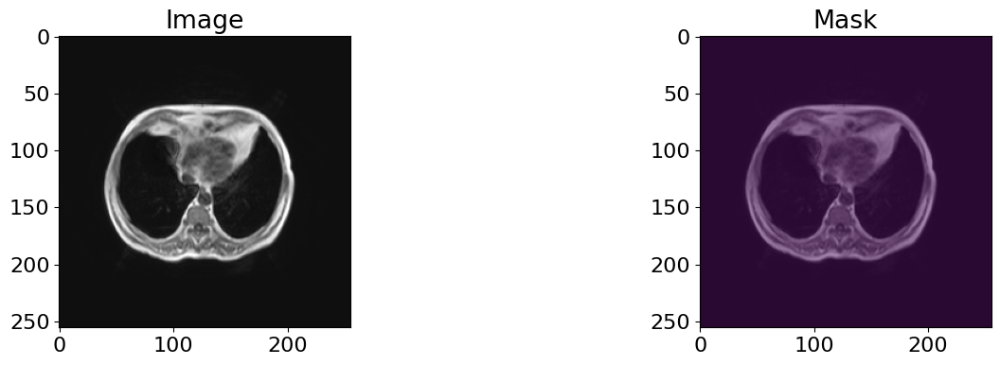

In [24]:
def plot_pairs(data, labels, index=None):
    if index == None:
        index = np.random.randint(0,len(data))
    fig, axes = plt.subplots(1, 2, figsize=(16,4))
    axes[0].set_title("Image")
    axes[0].imshow(data[index])
    axes[1].set_title("Mask")
    axes[1].imshow(data[index])
    #colored_image = display_color_mapped_image_continuous(labels[index])
    axes[1].imshow(np.squeeze(labels[index]),alpha=0.5)
    plt.show()
plot_pairs(X_train,y_train)

In [25]:
input_shape = X_train.shape[1:]
print('Input shape',input_shape)

Input shape (256, 256, 3)


<h3>Build UNet</h3>

In [26]:
def conv_block(inputs,num_filters):
    x = tfkl.Conv2D(num_filters,3,padding='same')(inputs)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Activation('relu')(x)  
    x = tfkl.Conv2D(num_filters,3,padding='same')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Activation('relu')(x)  
    return x

In [27]:
def define_decoder(inputs,skip_layer,num_filters):
    init = tfk.initializers.RandomNormal(stddev=0.02)
    x = tfkl.Conv2DTranspose(num_filters,(2,2),strides=(2,2),padding='same',kernel_initializer=init)(inputs)  
    g = tfkl.Concatenate()([x,skip_layer])
    g = conv_block(g,num_filters)
    return g

In [28]:
def vgg16_unet(input_shape = input_shape, num_classes = num_classes, seed = seed):
    tf.random.set_seed(seed)
    inputs = tfkl.Input(shape=input_shape, name='input_layer')
    vgg16 = tfk.applications.VGG16(include_top=False,weights='imagenet',input_tensor=inputs)  # We will extract encoder layers based on their output shape from vgg16 model  
    vgg16.trainable = False
    s1 = vgg16.get_layer('block1_conv2').output  
    s2 = vgg16.get_layer('block2_conv2').output  
    s3 = vgg16.get_layer('block3_conv3').output  
    s4 = vgg16.get_layer('block4_conv3').output    # bottleneck/bridege layer from vgg16
    b1 = vgg16.get_layer('block5_conv3').output #32
  
    # Decoder Block
    d1 = define_decoder(b1,s4,512)
    d2 = define_decoder(d1,s3,256)
    d3 = define_decoder(d2,s2,128)
    d4 = define_decoder(d3,s1,64)  #output layer
    outputs = tfkl.Conv2D(num_classes,1,padding='same',activation='sigmoid')(d4)
    model = tfk.Model(inputs,outputs)
  
    return model

58889256/58889256 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 256, 256, 64)         1792      ['input_layer[0][0]']         
                                                                                                  
 block1_conv2 (Conv2D)       (None, 256, 256, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)         0         ['block1_conv2[0][0]']        
                             

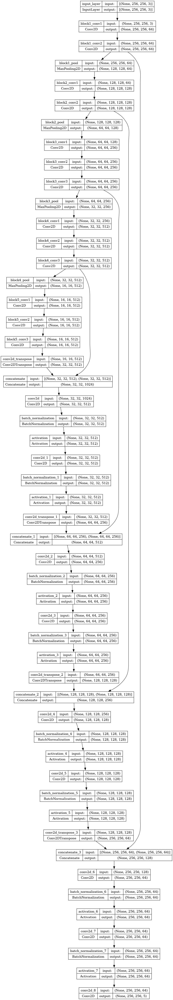

In [29]:
model = vgg16_unet()
model.summary()
tf.keras.utils.plot_model(model, show_shapes=True, expand_nested=True)

In [30]:
# Define a custom metric class for mean intersection over union (IoU)
class UpdatedMeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes=None, name="mean_iou", dtype=None):
        super(UpdatedMeanIoU, self).__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.math.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

# Define a callback class for visualization during training
class VizCallback(tf.keras.callbacks.Callback):

    def __init__(self, image, label):
        super().__init__()
        self.image = image
        self.label = label

    def on_epoch_end(self, epoch, logs=None):
        # Predict using the model and visualize ground truth vs predicted mask
        pred = model.predict(self.image, verbose=0)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (256, 256, 1))
        fig, axes = plt.subplots(1, 2, figsize=(16, 4))
        axes[0].imshow(self.image[0], cmap='gray')
        axes[0].imshow(np.squeeze(self.label),alpha=0.5)
        axes[0].set_title("Ground Truth Mask")
        #colored_image = display_color_mapped_image_continuous(y_pred)
        axes[1].imshow(self.image[0], cmap='gray')
        axes[1].imshow(np.squeeze(y_pred),alpha=0.5)
        axes[1].set_title("Predicted Mask")
        plt.tight_layout()
        plt.show()

In [31]:
learning_rate = 1e-3
batch_size = 32
epochs = 1000

In [32]:
model.compile(
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer = tfk.optimizers.AdamW(learning_rate,weight_decay = 5e-4),
    metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes)]
    )

patience = 80
early_stopping = tfk.callbacks.EarlyStopping(monitor='val_mean_iou', mode='max', patience=patience, restore_best_weights=True)
viz_callback = VizCallback(np.expand_dims(X_val[0],axis=0), np.expand_dims(y_val[0],axis=0))
scheduler = tfk.callbacks.ReduceLROnPlateau(monitor='val_mean_iou', mode='max', factor=0.1, patience=patience-40, min_lr=1e-5)

Epoch 1/1000


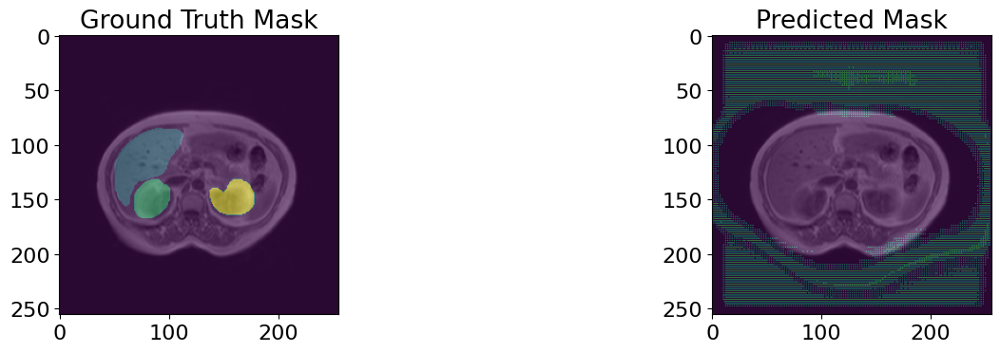

32/32 - 61s - loss: 0.6279 - accuracy: 0.8635 - mean_iou: 0.2021 - val_loss: 0.6473 - val_accuracy: 0.8091 - val_mean_iou: 0.1660 - lr: 0.0010 - 61s/epoch - 2s/step
Epoch 2/1000


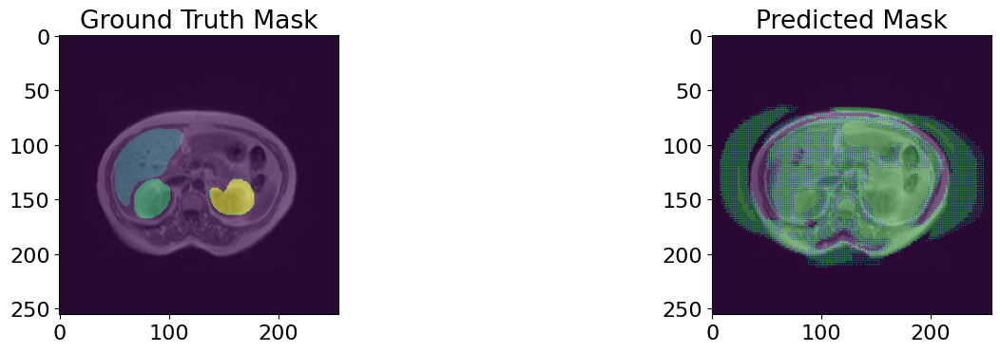

32/32 - 18s - loss: 0.1777 - accuracy: 0.9730 - mean_iou: 0.3156 - val_loss: 0.4617 - val_accuracy: 0.8633 - val_mean_iou: 0.1749 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 3/1000


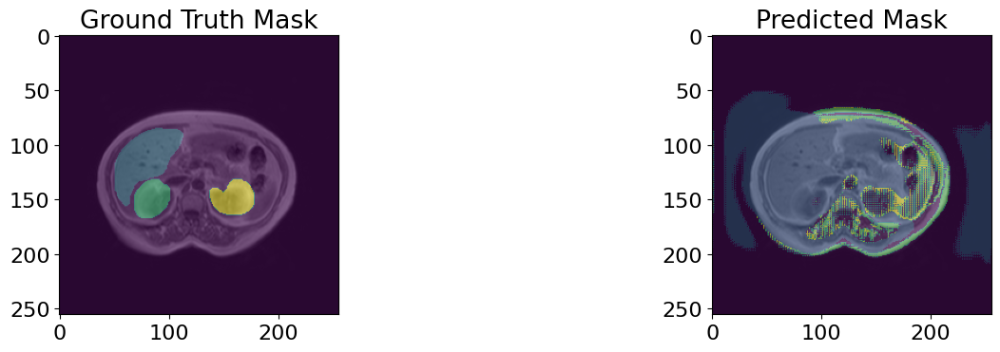

32/32 - 18s - loss: 0.1097 - accuracy: 0.9763 - mean_iou: 0.3757 - val_loss: 0.3051 - val_accuracy: 0.9392 - val_mean_iou: 0.1921 - lr: 0.0010 - 18s/epoch - 572ms/step
Epoch 4/1000


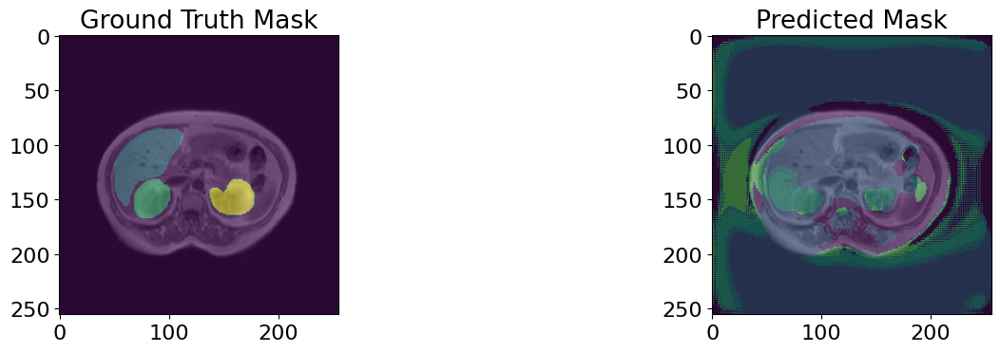

32/32 - 19s - loss: 0.0811 - accuracy: 0.9799 - mean_iou: 0.5039 - val_loss: 0.2029 - val_accuracy: 0.9569 - val_mean_iou: 0.1972 - lr: 0.0010 - 19s/epoch - 597ms/step
Epoch 5/1000


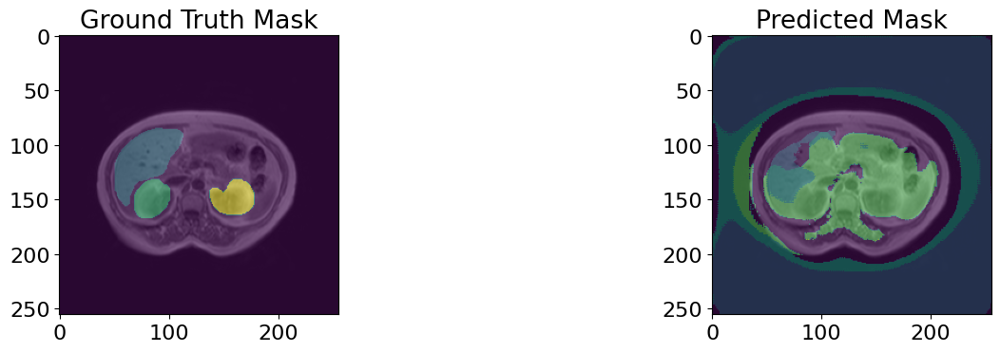

32/32 - 18s - loss: 0.0682 - accuracy: 0.9820 - mean_iou: 0.5968 - val_loss: 0.2047 - val_accuracy: 0.9591 - val_mean_iou: 0.2160 - lr: 0.0010 - 18s/epoch - 576ms/step
Epoch 6/1000


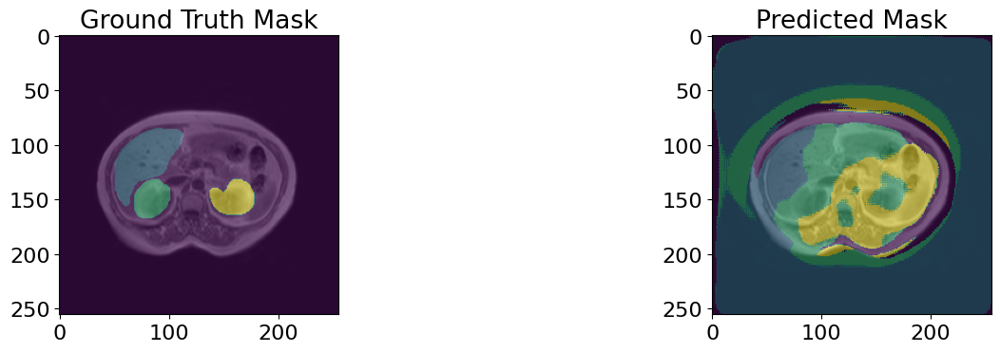

32/32 - 18s - loss: 0.0561 - accuracy: 0.9843 - mean_iou: 0.6586 - val_loss: 0.1811 - val_accuracy: 0.9583 - val_mean_iou: 0.2177 - lr: 0.0010 - 18s/epoch - 577ms/step
Epoch 7/1000


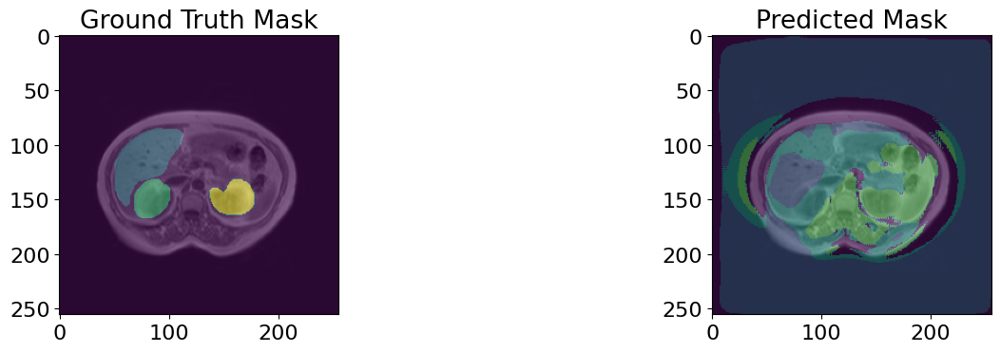

32/32 - 18s - loss: 0.0506 - accuracy: 0.9850 - mean_iou: 0.6847 - val_loss: 0.1825 - val_accuracy: 0.9566 - val_mean_iou: 0.2299 - lr: 0.0010 - 18s/epoch - 573ms/step
Epoch 8/1000


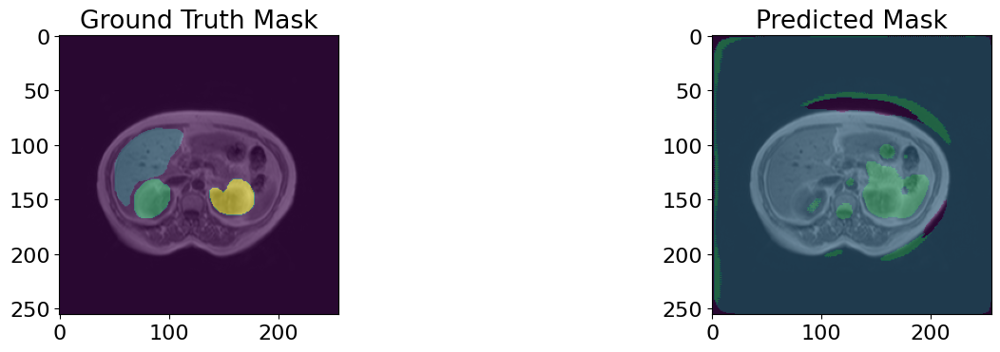

32/32 - 18s - loss: 0.0496 - accuracy: 0.9851 - mean_iou: 0.6854 - val_loss: 0.1753 - val_accuracy: 0.9538 - val_mean_iou: 0.2731 - lr: 0.0010 - 18s/epoch - 577ms/step
Epoch 9/1000


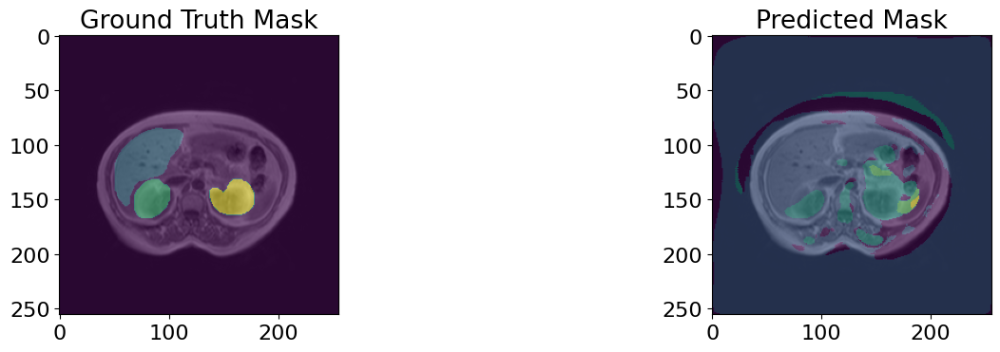

32/32 - 18s - loss: 0.0405 - accuracy: 0.9874 - mean_iou: 0.7199 - val_loss: 0.1550 - val_accuracy: 0.9585 - val_mean_iou: 0.2327 - lr: 0.0010 - 18s/epoch - 572ms/step
Epoch 10/1000


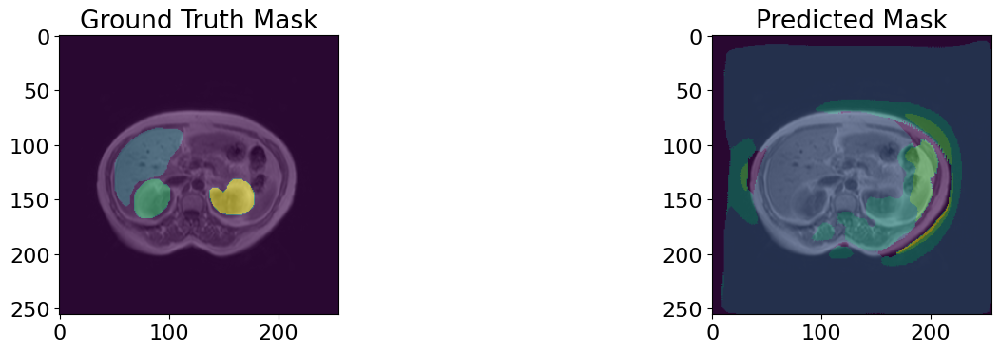

32/32 - 18s - loss: 0.0359 - accuracy: 0.9884 - mean_iou: 0.7398 - val_loss: 0.2104 - val_accuracy: 0.9575 - val_mean_iou: 0.2611 - lr: 0.0010 - 18s/epoch - 572ms/step
Epoch 11/1000


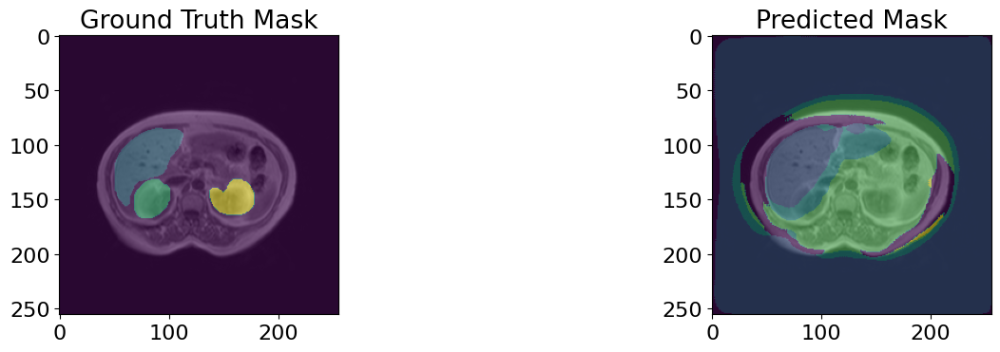

32/32 - 18s - loss: 0.0341 - accuracy: 0.9887 - mean_iou: 0.7607 - val_loss: 0.2283 - val_accuracy: 0.9574 - val_mean_iou: 0.2578 - lr: 0.0010 - 18s/epoch - 572ms/step
Epoch 12/1000


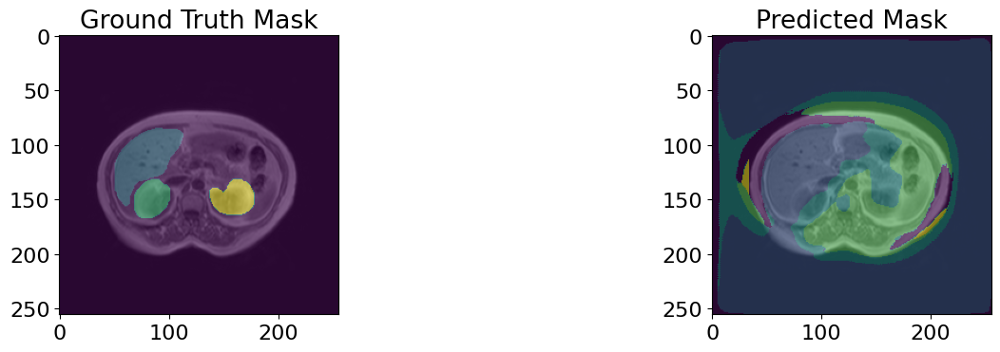

32/32 - 18s - loss: 0.0301 - accuracy: 0.9898 - mean_iou: 0.7756 - val_loss: 0.1879 - val_accuracy: 0.9576 - val_mean_iou: 0.2583 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 13/1000


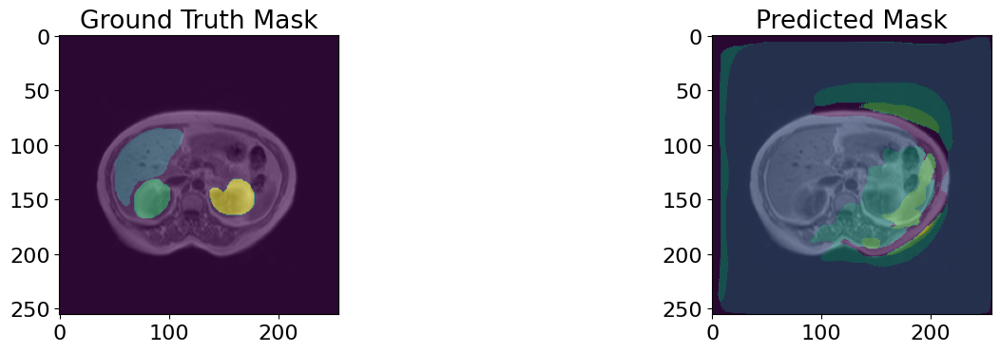

32/32 - 18s - loss: 0.0274 - accuracy: 0.9907 - mean_iou: 0.7924 - val_loss: 0.2233 - val_accuracy: 0.9577 - val_mean_iou: 0.2411 - lr: 0.0010 - 18s/epoch - 573ms/step
Epoch 14/1000


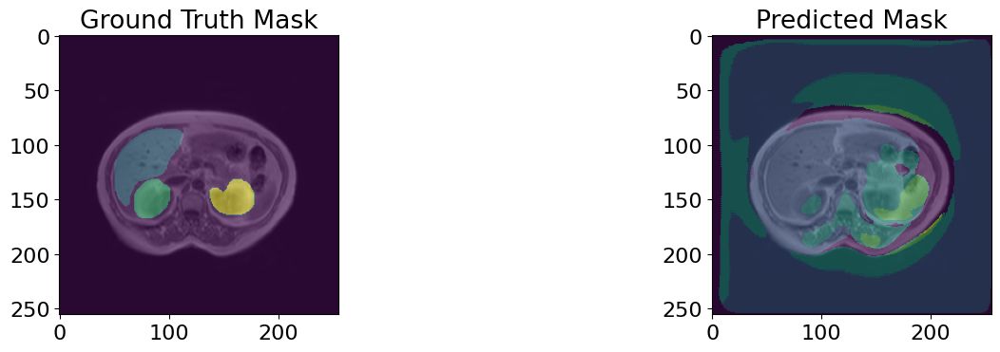

32/32 - 18s - loss: 0.0288 - accuracy: 0.9901 - mean_iou: 0.7901 - val_loss: 0.2374 - val_accuracy: 0.9575 - val_mean_iou: 0.2533 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 15/1000


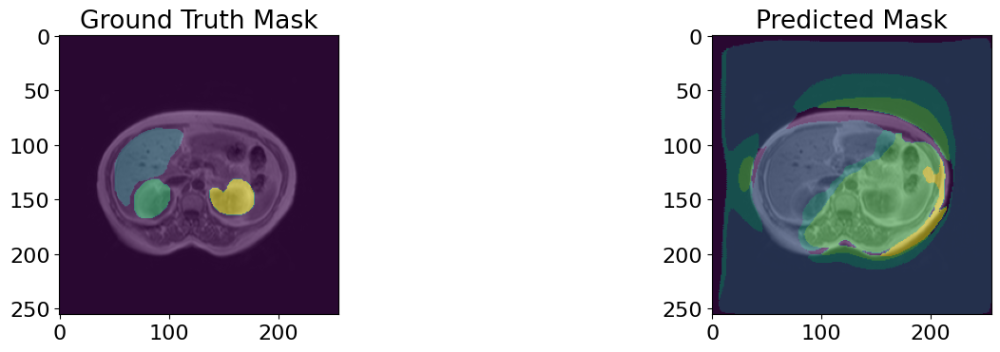

32/32 - 18s - loss: 0.0265 - accuracy: 0.9909 - mean_iou: 0.8069 - val_loss: 0.2080 - val_accuracy: 0.9563 - val_mean_iou: 0.2528 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 16/1000


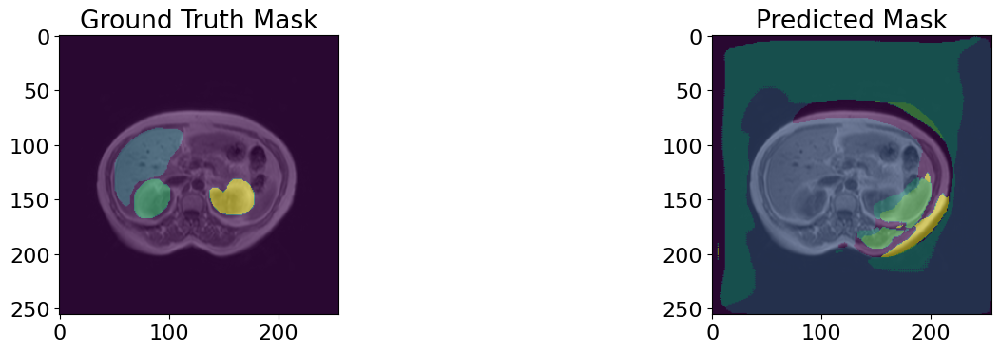

32/32 - 18s - loss: 0.0243 - accuracy: 0.9914 - mean_iou: 0.8149 - val_loss: 0.2278 - val_accuracy: 0.9577 - val_mean_iou: 0.2619 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 17/1000


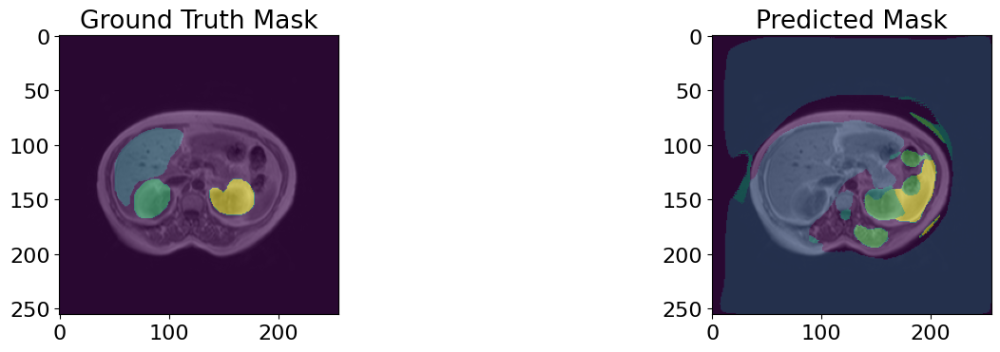

32/32 - 18s - loss: 0.0230 - accuracy: 0.9918 - mean_iou: 0.8261 - val_loss: 0.2397 - val_accuracy: 0.9565 - val_mean_iou: 0.2496 - lr: 0.0010 - 18s/epoch - 571ms/step
Epoch 18/1000


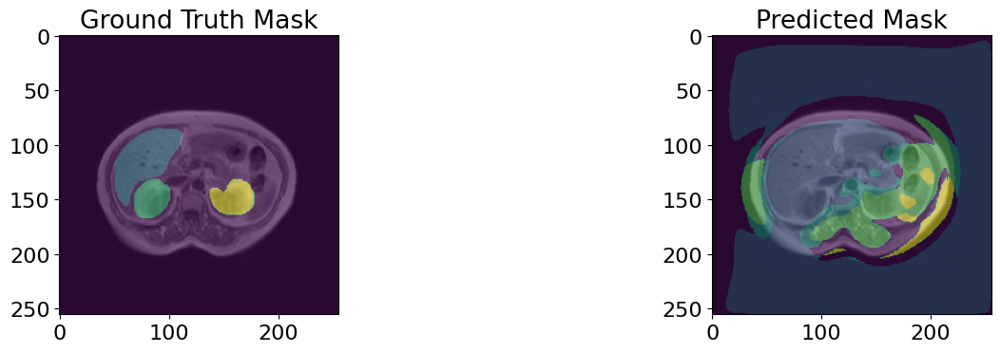

32/32 - 18s - loss: 0.0226 - accuracy: 0.9920 - mean_iou: 0.8141 - val_loss: 0.2041 - val_accuracy: 0.9573 - val_mean_iou: 0.2568 - lr: 0.0010 - 18s/epoch - 571ms/step
Epoch 19/1000


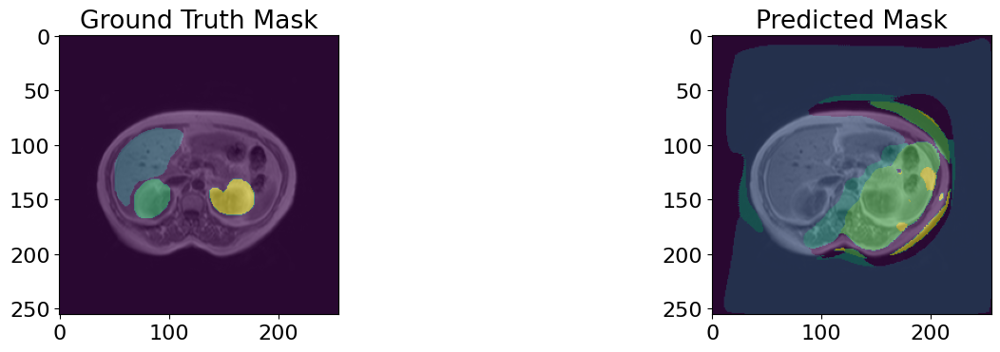

32/32 - 18s - loss: 0.0202 - accuracy: 0.9927 - mean_iou: 0.8417 - val_loss: 0.2145 - val_accuracy: 0.9577 - val_mean_iou: 0.2575 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 20/1000


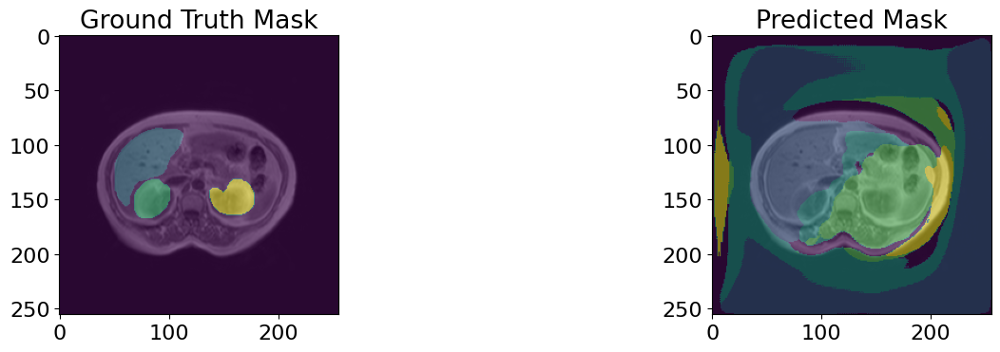

32/32 - 18s - loss: 0.0207 - accuracy: 0.9925 - mean_iou: 0.8439 - val_loss: 0.2328 - val_accuracy: 0.9577 - val_mean_iou: 0.2400 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 21/1000


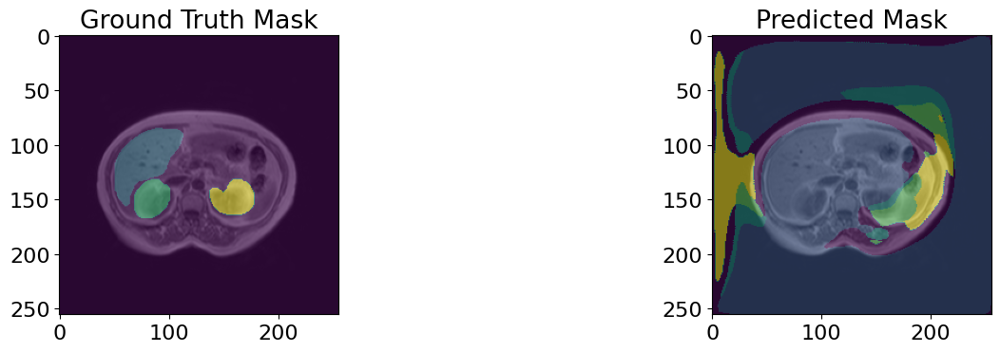

32/32 - 18s - loss: 0.0189 - accuracy: 0.9932 - mean_iou: 0.8529 - val_loss: 0.2424 - val_accuracy: 0.9577 - val_mean_iou: 0.2356 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 22/1000


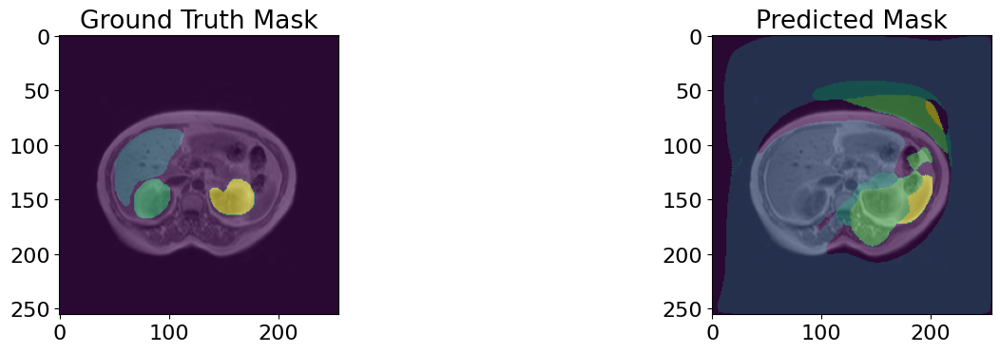

32/32 - 18s - loss: 0.0179 - accuracy: 0.9935 - mean_iou: 0.8605 - val_loss: 0.2315 - val_accuracy: 0.9577 - val_mean_iou: 0.2416 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 23/1000


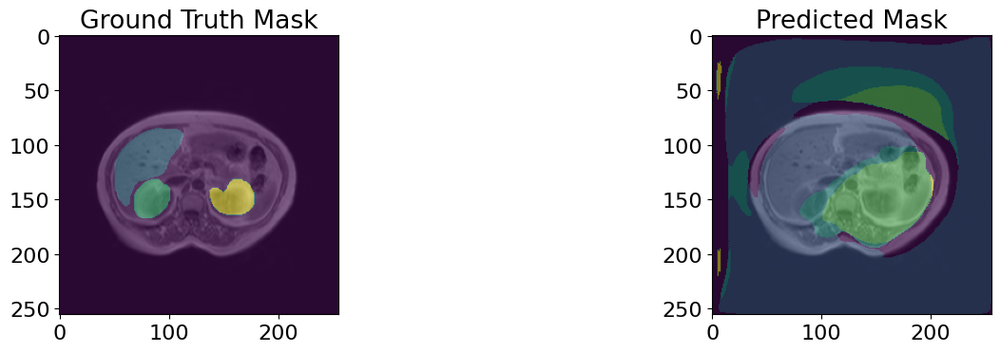

32/32 - 18s - loss: 0.0180 - accuracy: 0.9934 - mean_iou: 0.8558 - val_loss: 0.2418 - val_accuracy: 0.9574 - val_mean_iou: 0.2293 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 24/1000


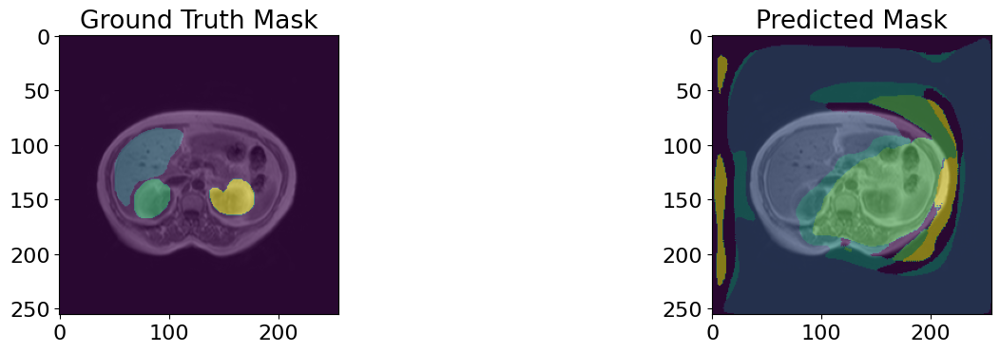

32/32 - 18s - loss: 0.0169 - accuracy: 0.9937 - mean_iou: 0.8664 - val_loss: 0.2422 - val_accuracy: 0.9575 - val_mean_iou: 0.2294 - lr: 0.0010 - 18s/epoch - 571ms/step
Epoch 25/1000


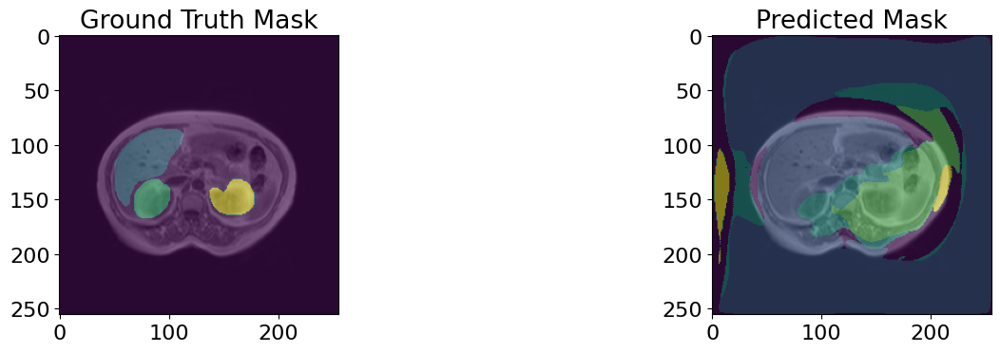

32/32 - 18s - loss: 0.0171 - accuracy: 0.9937 - mean_iou: 0.8627 - val_loss: 0.2293 - val_accuracy: 0.9576 - val_mean_iou: 0.2304 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 26/1000


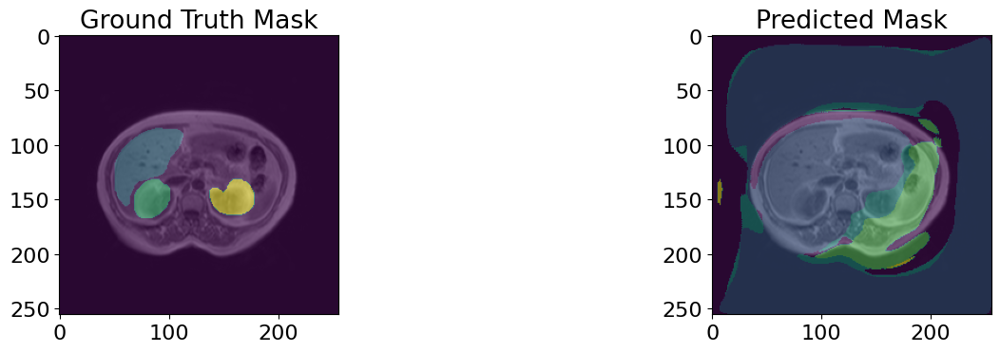

32/32 - 18s - loss: 0.0166 - accuracy: 0.9939 - mean_iou: 0.8634 - val_loss: 0.2340 - val_accuracy: 0.9578 - val_mean_iou: 0.2355 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 27/1000


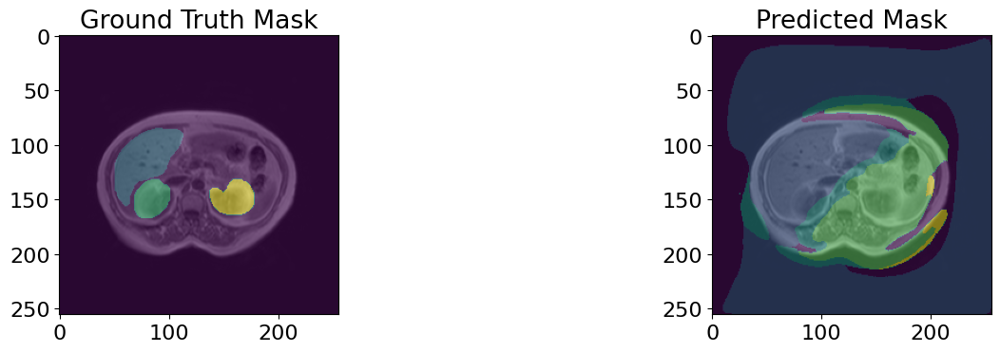

32/32 - 18s - loss: 0.0166 - accuracy: 0.9938 - mean_iou: 0.8708 - val_loss: 0.2273 - val_accuracy: 0.9577 - val_mean_iou: 0.2368 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 28/1000


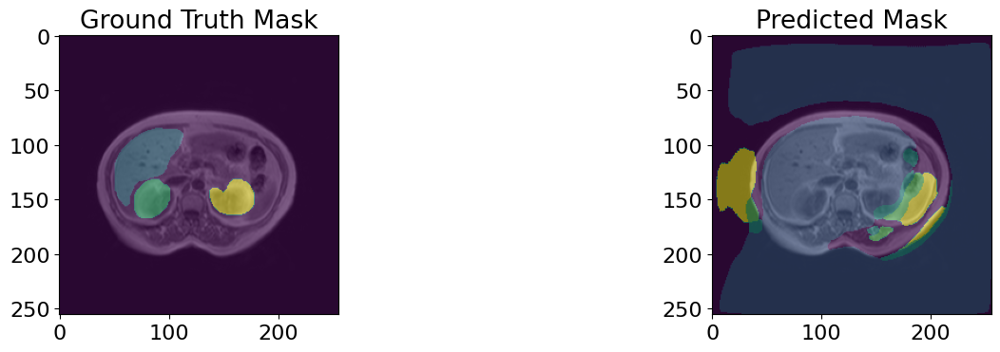

32/32 - 18s - loss: 0.0144 - accuracy: 0.9946 - mean_iou: 0.8846 - val_loss: 0.2294 - val_accuracy: 0.9582 - val_mean_iou: 0.2553 - lr: 0.0010 - 18s/epoch - 576ms/step
Epoch 29/1000


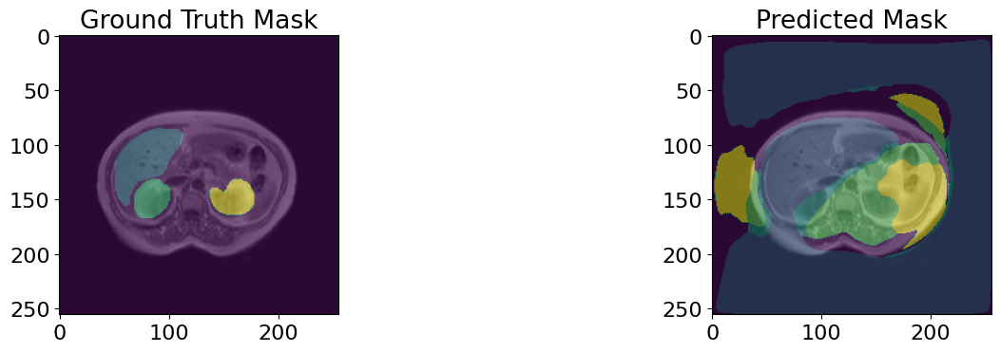

32/32 - 18s - loss: 0.0136 - accuracy: 0.9948 - mean_iou: 0.8904 - val_loss: 0.2314 - val_accuracy: 0.9571 - val_mean_iou: 0.2126 - lr: 0.0010 - 18s/epoch - 573ms/step
Epoch 30/1000


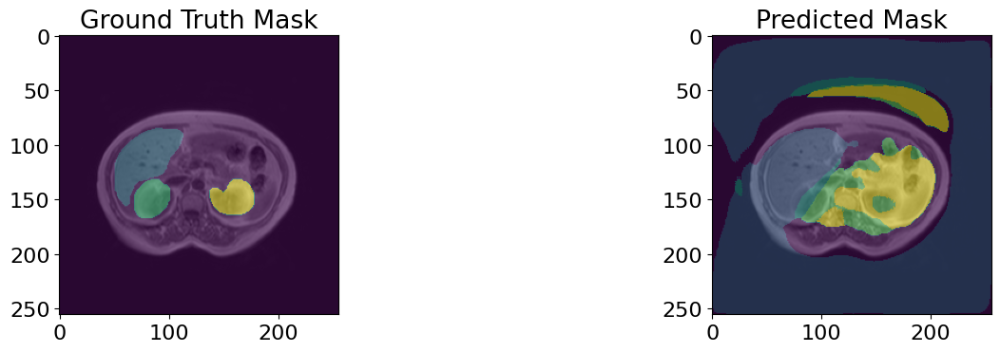

32/32 - 18s - loss: 0.0131 - accuracy: 0.9950 - mean_iou: 0.8949 - val_loss: 0.2688 - val_accuracy: 0.9569 - val_mean_iou: 0.2003 - lr: 0.0010 - 18s/epoch - 573ms/step
Epoch 31/1000


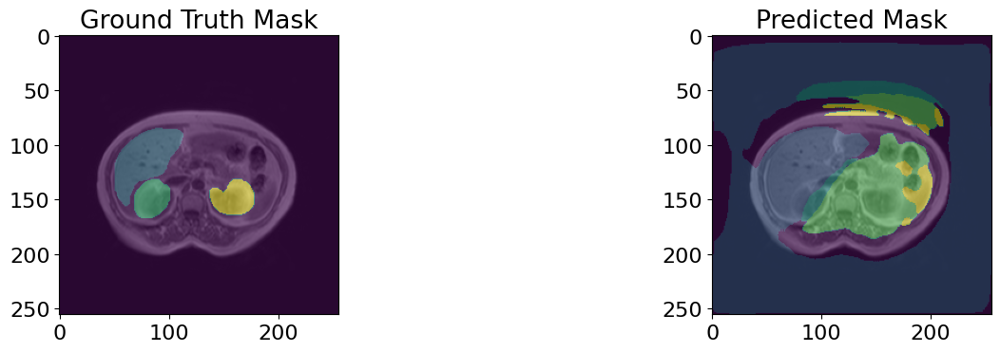

32/32 - 18s - loss: 0.0157 - accuracy: 0.9942 - mean_iou: 0.8811 - val_loss: 0.2411 - val_accuracy: 0.9568 - val_mean_iou: 0.1995 - lr: 0.0010 - 18s/epoch - 572ms/step
Epoch 32/1000


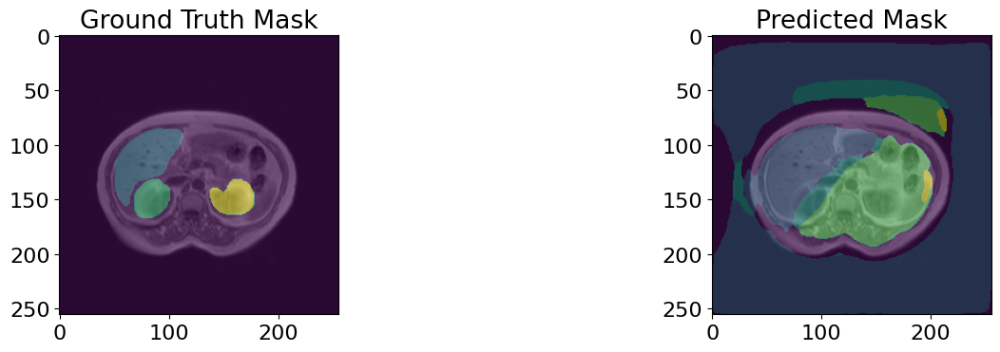

32/32 - 18s - loss: 0.0140 - accuracy: 0.9948 - mean_iou: 0.8905 - val_loss: 0.2140 - val_accuracy: 0.9572 - val_mean_iou: 0.2063 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 33/1000


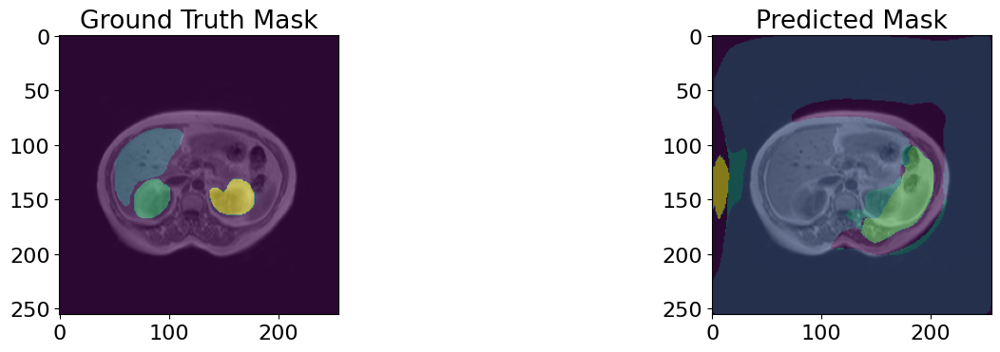

32/32 - 18s - loss: 0.0165 - accuracy: 0.9941 - mean_iou: 0.8710 - val_loss: 0.1980 - val_accuracy: 0.9587 - val_mean_iou: 0.2338 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 34/1000


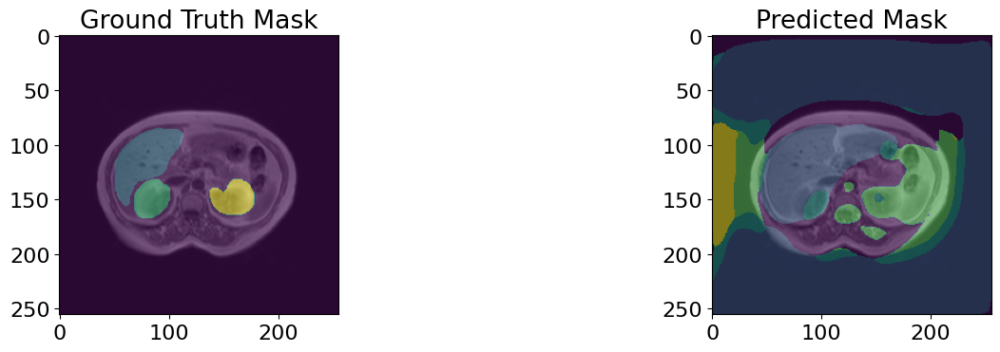

32/32 - 18s - loss: 0.0145 - accuracy: 0.9947 - mean_iou: 0.8815 - val_loss: 0.2295 - val_accuracy: 0.9571 - val_mean_iou: 0.2087 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 35/1000


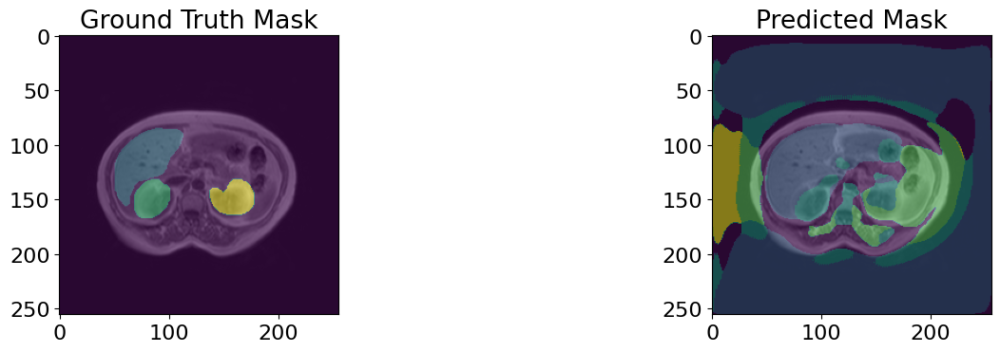

32/32 - 18s - loss: 0.0132 - accuracy: 0.9951 - mean_iou: 0.8955 - val_loss: 0.2278 - val_accuracy: 0.9569 - val_mean_iou: 0.2013 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 36/1000


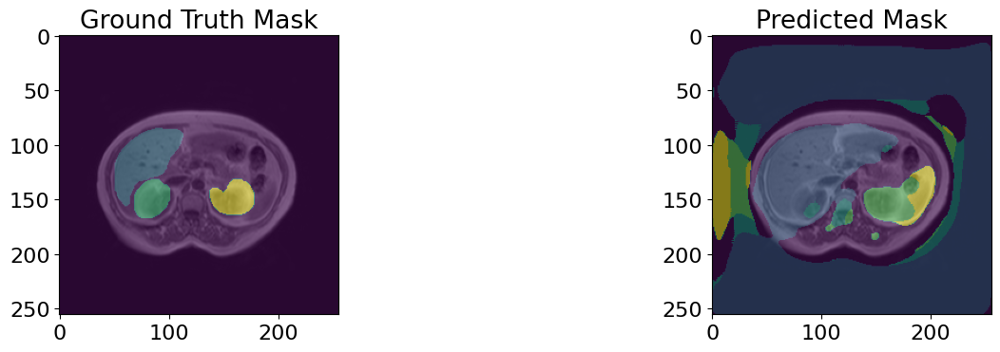

32/32 - 18s - loss: 0.0140 - accuracy: 0.9949 - mean_iou: 0.8890 - val_loss: 0.2982 - val_accuracy: 0.9567 - val_mean_iou: 0.1938 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 37/1000


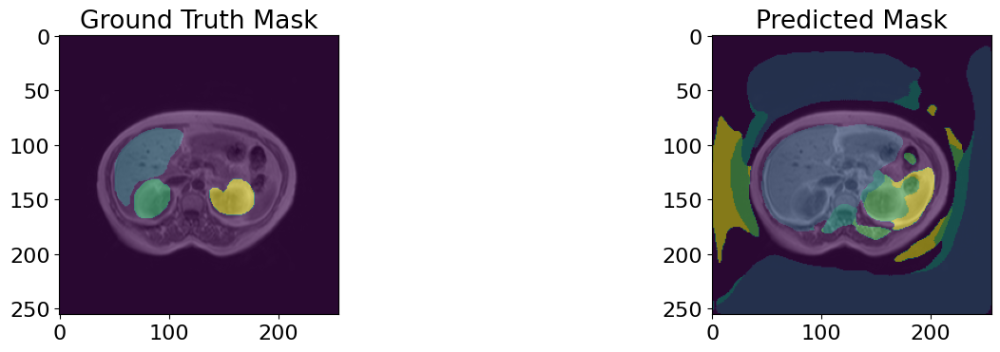

32/32 - 18s - loss: 0.0123 - accuracy: 0.9953 - mean_iou: 0.8943 - val_loss: 0.2843 - val_accuracy: 0.9568 - val_mean_iou: 0.1992 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 38/1000


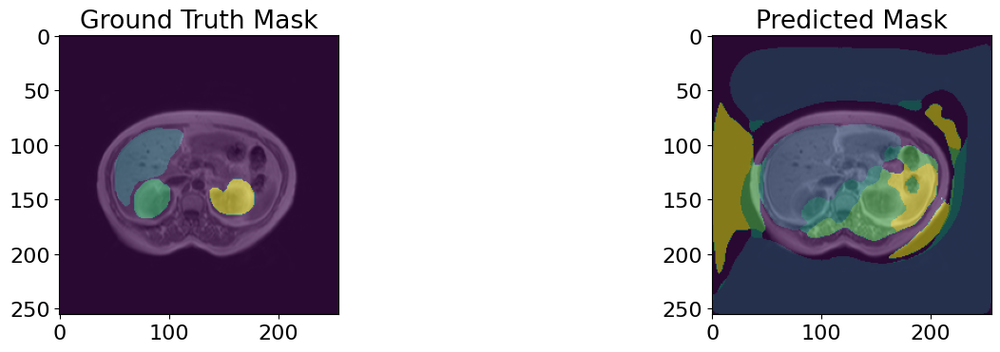

32/32 - 18s - loss: 0.0128 - accuracy: 0.9952 - mean_iou: 0.9002 - val_loss: 0.2617 - val_accuracy: 0.9569 - val_mean_iou: 0.2037 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 39/1000


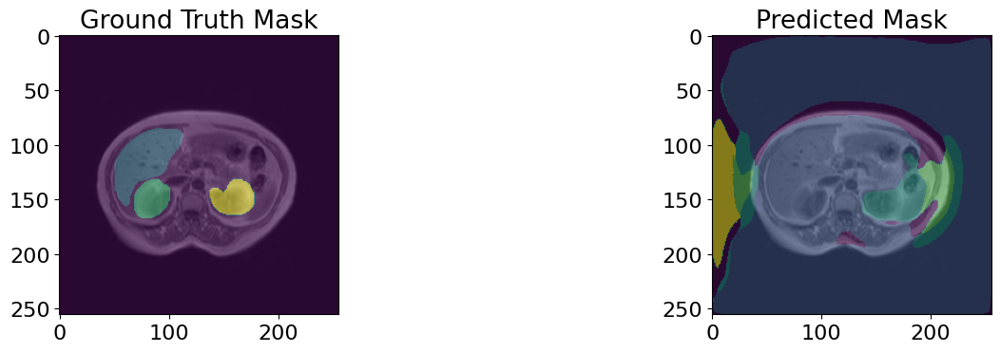

32/32 - 18s - loss: 0.0155 - accuracy: 0.9942 - mean_iou: 0.8791 - val_loss: 0.2226 - val_accuracy: 0.9571 - val_mean_iou: 0.2167 - lr: 0.0010 - 18s/epoch - 576ms/step
Epoch 40/1000


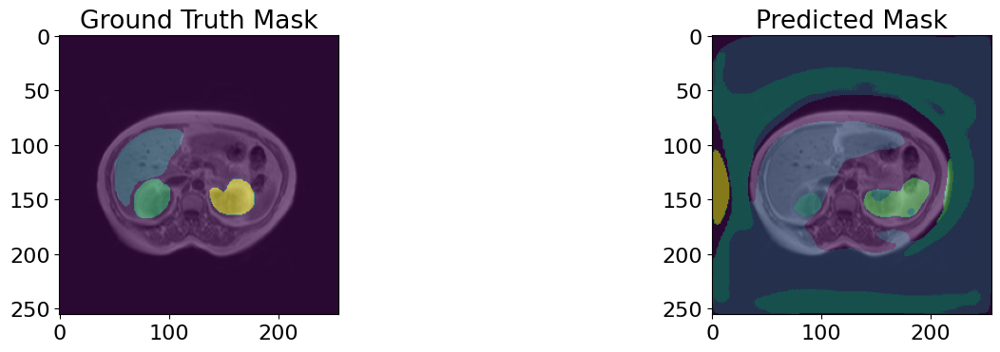

32/32 - 18s - loss: 0.0163 - accuracy: 0.9938 - mean_iou: 0.8775 - val_loss: 0.2368 - val_accuracy: 0.9566 - val_mean_iou: 0.1966 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 41/1000


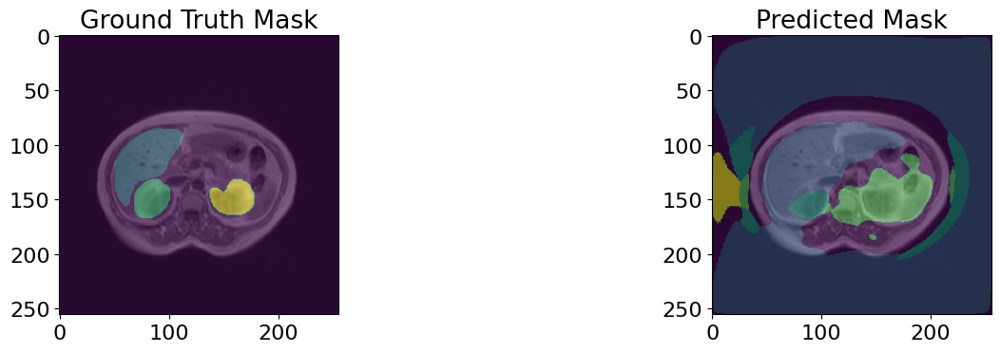

32/32 - 18s - loss: 0.0124 - accuracy: 0.9953 - mean_iou: 0.8936 - val_loss: 0.2205 - val_accuracy: 0.9568 - val_mean_iou: 0.1976 - lr: 0.0010 - 18s/epoch - 572ms/step
Epoch 42/1000


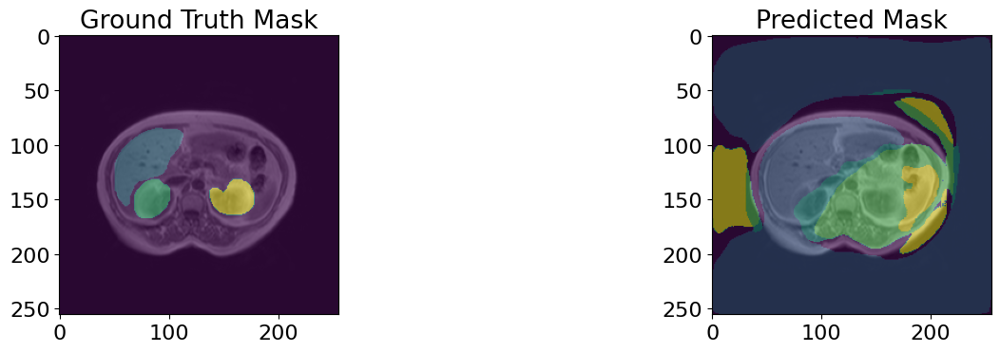

32/32 - 18s - loss: 0.0115 - accuracy: 0.9956 - mean_iou: 0.9003 - val_loss: 0.1931 - val_accuracy: 0.9569 - val_mean_iou: 0.1954 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 43/1000


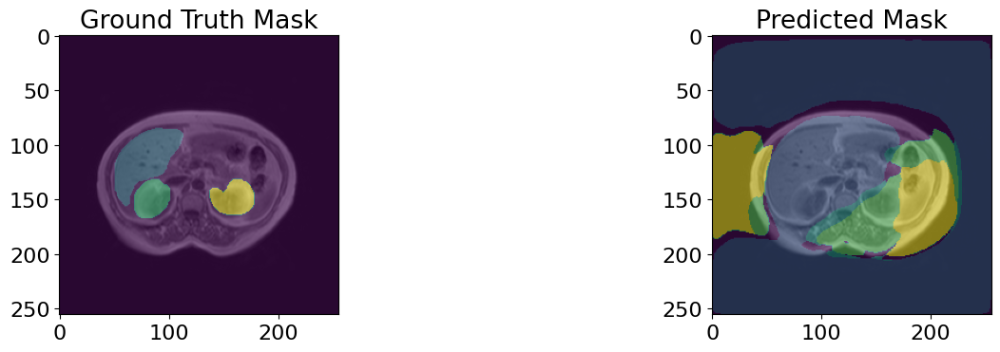

32/32 - 18s - loss: 0.0114 - accuracy: 0.9958 - mean_iou: 0.9039 - val_loss: 0.2291 - val_accuracy: 0.9569 - val_mean_iou: 0.1965 - lr: 0.0010 - 18s/epoch - 575ms/step
Epoch 44/1000


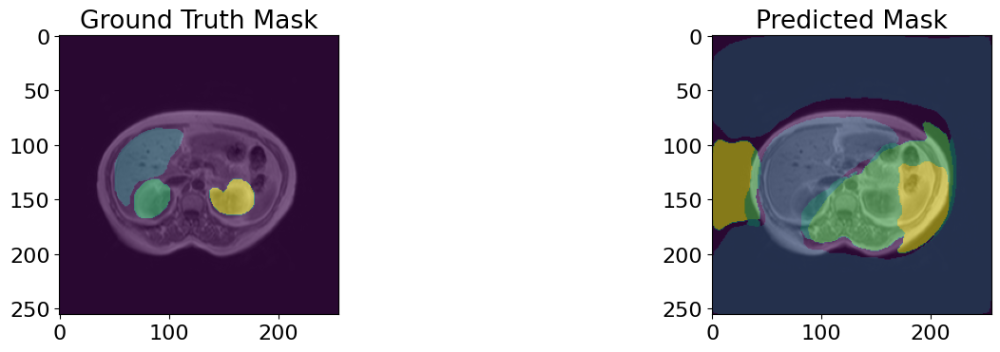

32/32 - 18s - loss: 0.0122 - accuracy: 0.9953 - mean_iou: 0.8917 - val_loss: 0.2361 - val_accuracy: 0.9568 - val_mean_iou: 0.1966 - lr: 0.0010 - 18s/epoch - 573ms/step
Epoch 45/1000


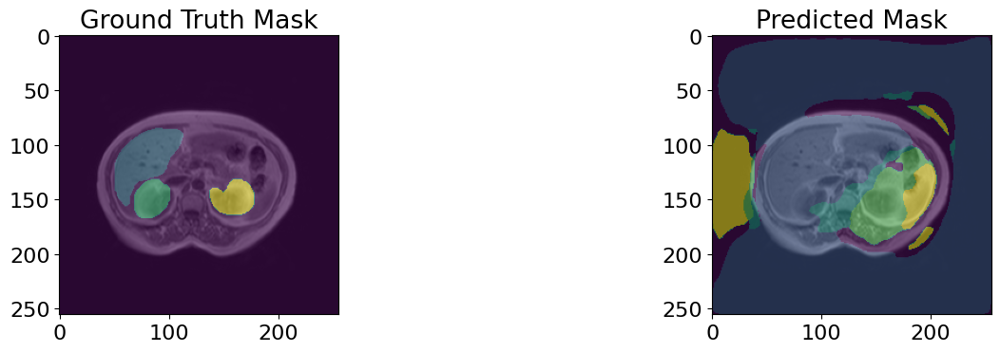

32/32 - 18s - loss: 0.0106 - accuracy: 0.9959 - mean_iou: 0.9084 - val_loss: 0.2603 - val_accuracy: 0.9568 - val_mean_iou: 0.1978 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 46/1000


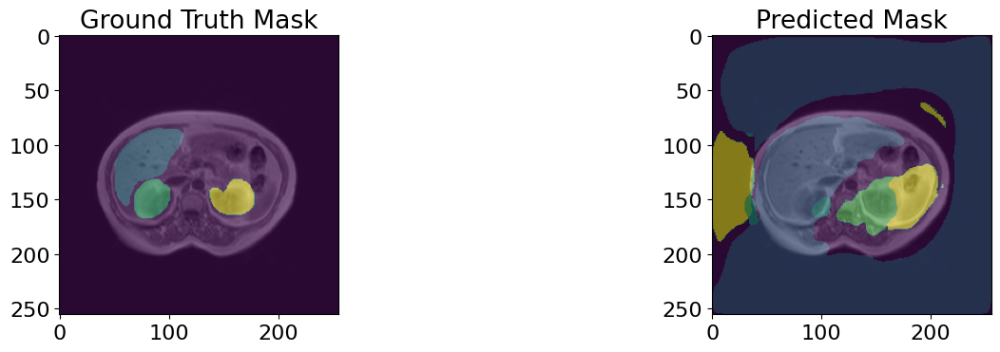

32/32 - 18s - loss: 0.0101 - accuracy: 0.9960 - mean_iou: 0.9160 - val_loss: 0.2890 - val_accuracy: 0.9570 - val_mean_iou: 0.2092 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 47/1000


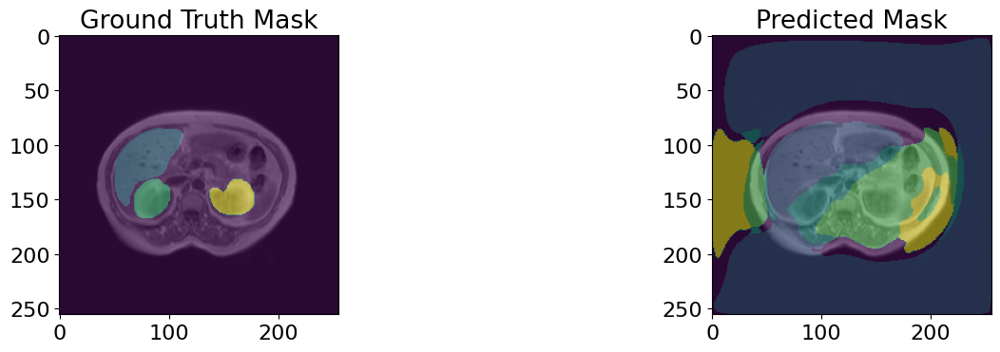

32/32 - 18s - loss: 0.0101 - accuracy: 0.9961 - mean_iou: 0.9118 - val_loss: 0.2915 - val_accuracy: 0.9572 - val_mean_iou: 0.2186 - lr: 0.0010 - 18s/epoch - 573ms/step
Epoch 48/1000


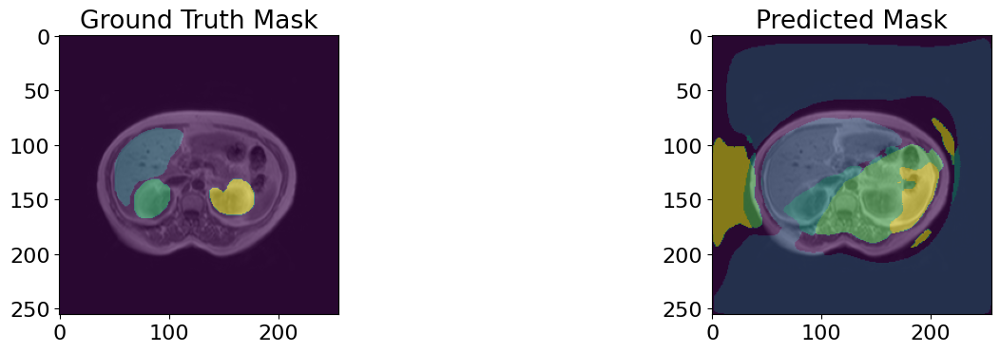

32/32 - 18s - loss: 0.0090 - accuracy: 0.9964 - mean_iou: 0.9222 - val_loss: 0.2782 - val_accuracy: 0.9570 - val_mean_iou: 0.2047 - lr: 0.0010 - 18s/epoch - 574ms/step
Epoch 49/1000


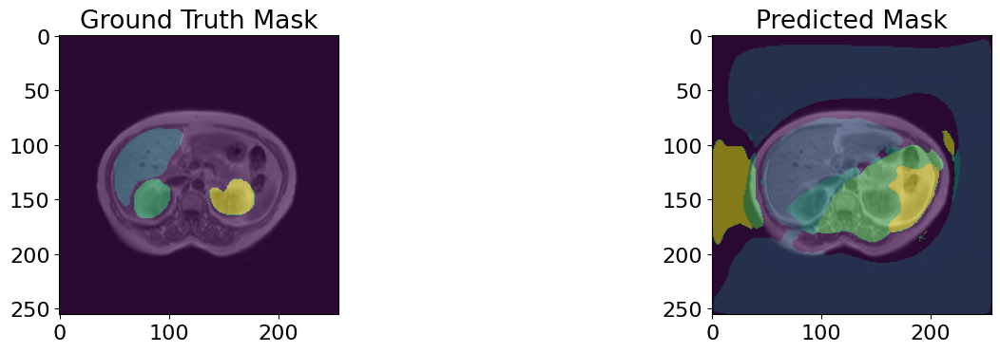

32/32 - 18s - loss: 0.0077 - accuracy: 0.9970 - mean_iou: 0.9336 - val_loss: 0.2724 - val_accuracy: 0.9570 - val_mean_iou: 0.2037 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 50/1000


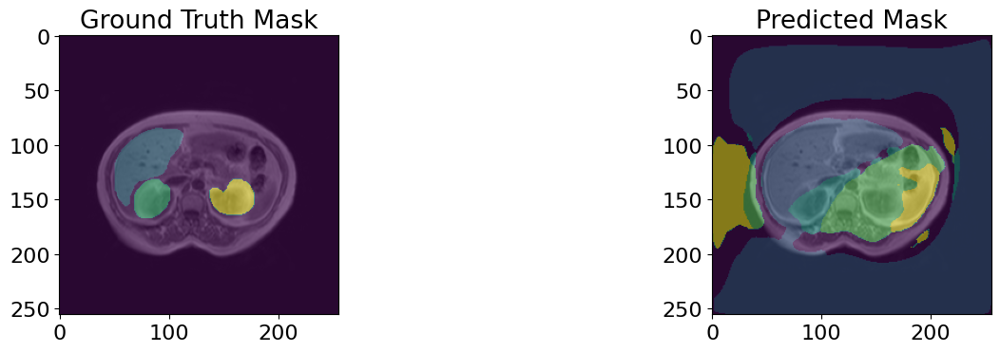

32/32 - 18s - loss: 0.0074 - accuracy: 0.9972 - mean_iou: 0.9384 - val_loss: 0.2824 - val_accuracy: 0.9570 - val_mean_iou: 0.2058 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 51/1000


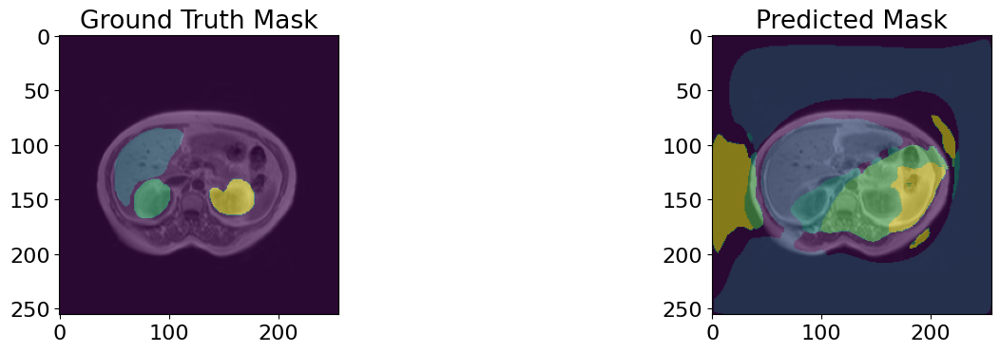

32/32 - 18s - loss: 0.0072 - accuracy: 0.9973 - mean_iou: 0.9390 - val_loss: 0.2965 - val_accuracy: 0.9571 - val_mean_iou: 0.2098 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 52/1000


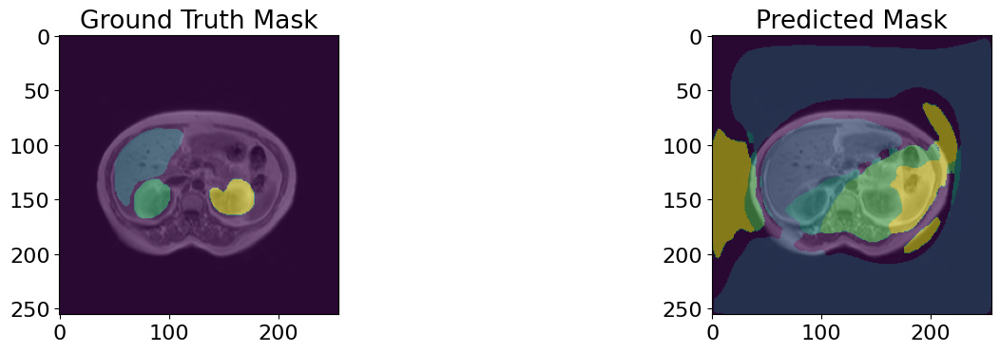

32/32 - 18s - loss: 0.0069 - accuracy: 0.9974 - mean_iou: 0.9415 - val_loss: 0.3036 - val_accuracy: 0.9572 - val_mean_iou: 0.2160 - lr: 1.0000e-04 - 18s/epoch - 576ms/step
Epoch 53/1000


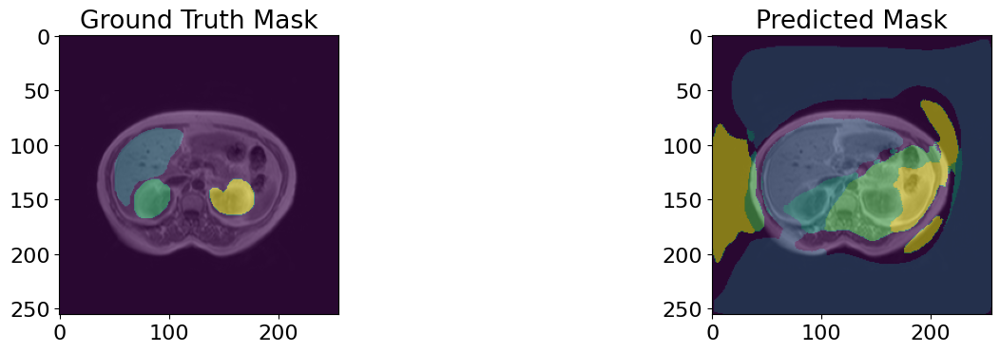

32/32 - 18s - loss: 0.0066 - accuracy: 0.9975 - mean_iou: 0.9433 - val_loss: 0.3042 - val_accuracy: 0.9572 - val_mean_iou: 0.2151 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 54/1000


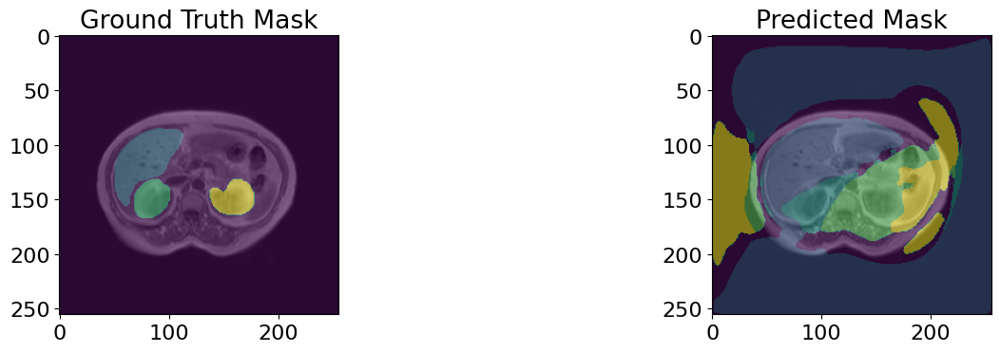

32/32 - 18s - loss: 0.0067 - accuracy: 0.9974 - mean_iou: 0.9425 - val_loss: 0.3131 - val_accuracy: 0.9573 - val_mean_iou: 0.2208 - lr: 1.0000e-04 - 18s/epoch - 572ms/step
Epoch 55/1000


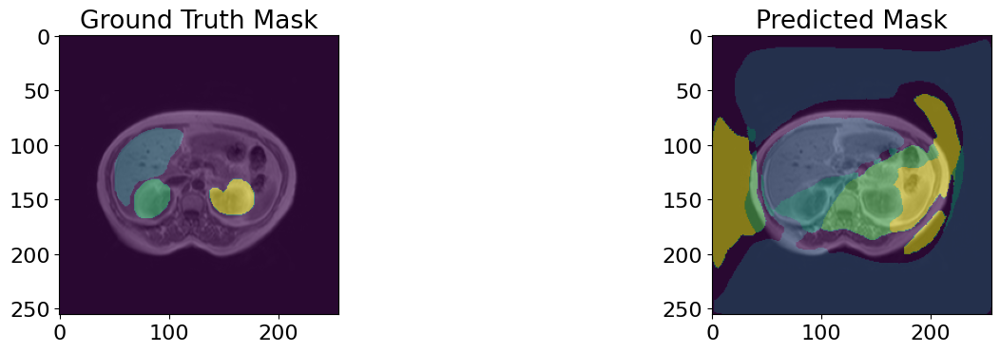

32/32 - 18s - loss: 0.0067 - accuracy: 0.9975 - mean_iou: 0.9431 - val_loss: 0.3158 - val_accuracy: 0.9574 - val_mean_iou: 0.2244 - lr: 1.0000e-04 - 18s/epoch - 572ms/step
Epoch 56/1000


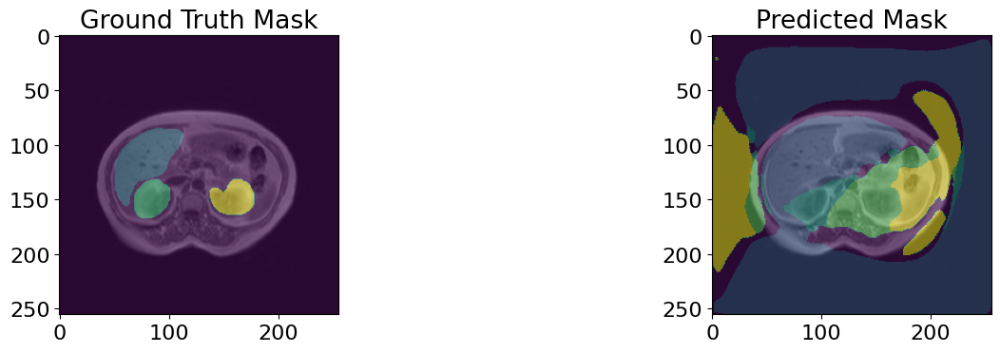

32/32 - 18s - loss: 0.0065 - accuracy: 0.9975 - mean_iou: 0.9447 - val_loss: 0.3135 - val_accuracy: 0.9574 - val_mean_iou: 0.2272 - lr: 1.0000e-04 - 18s/epoch - 572ms/step
Epoch 57/1000


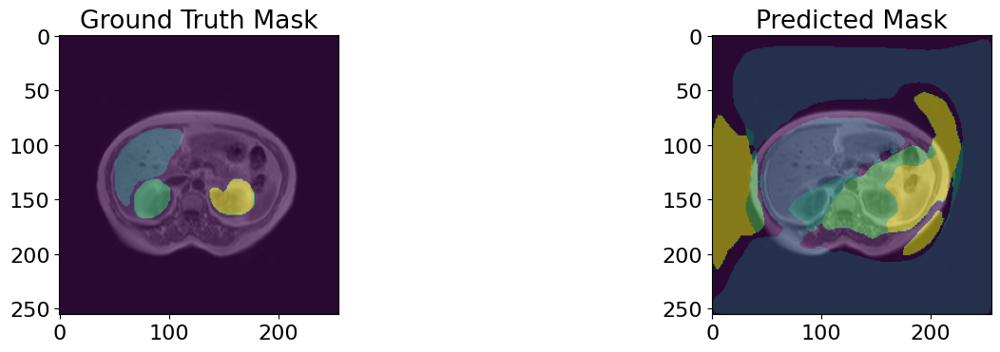

32/32 - 18s - loss: 0.0063 - accuracy: 0.9976 - mean_iou: 0.9461 - val_loss: 0.3228 - val_accuracy: 0.9574 - val_mean_iou: 0.2254 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 58/1000


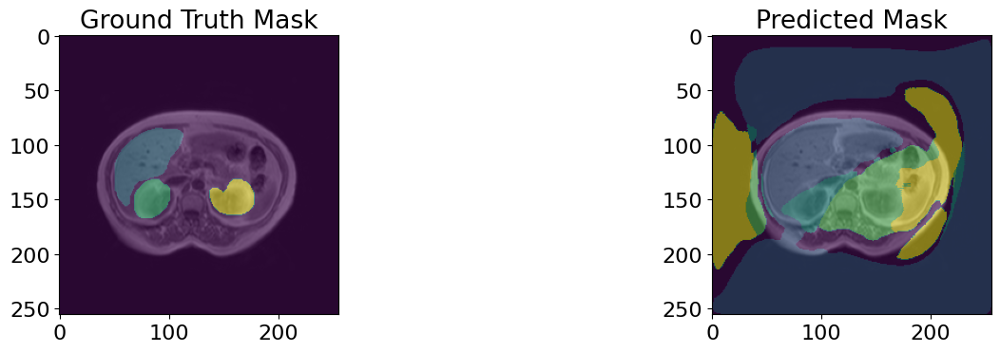

32/32 - 18s - loss: 0.0062 - accuracy: 0.9976 - mean_iou: 0.9473 - val_loss: 0.3210 - val_accuracy: 0.9573 - val_mean_iou: 0.2195 - lr: 1.0000e-04 - 18s/epoch - 575ms/step
Epoch 59/1000


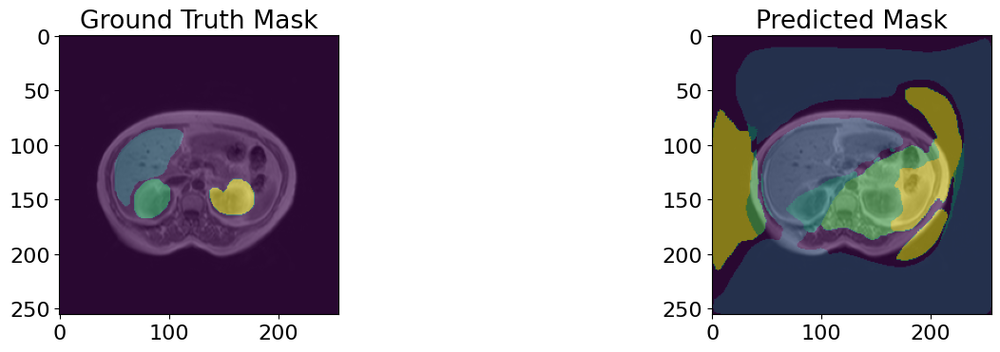

32/32 - 18s - loss: 0.0063 - accuracy: 0.9976 - mean_iou: 0.9479 - val_loss: 0.3200 - val_accuracy: 0.9572 - val_mean_iou: 0.2157 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 60/1000


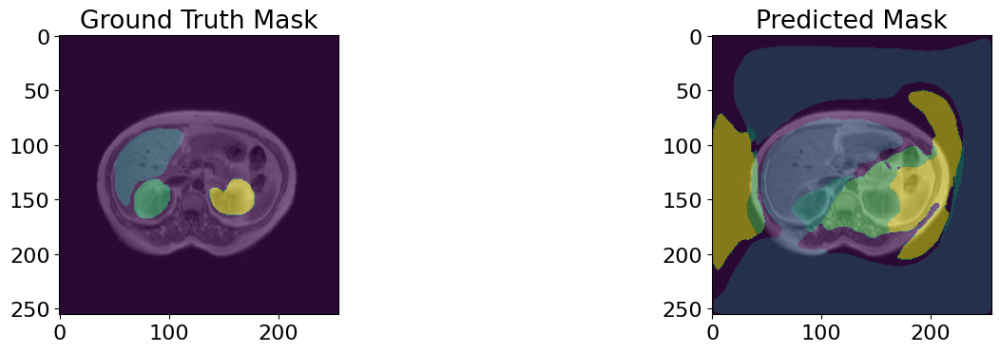

32/32 - 18s - loss: 0.0062 - accuracy: 0.9977 - mean_iou: 0.9466 - val_loss: 0.3249 - val_accuracy: 0.9573 - val_mean_iou: 0.2201 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 61/1000


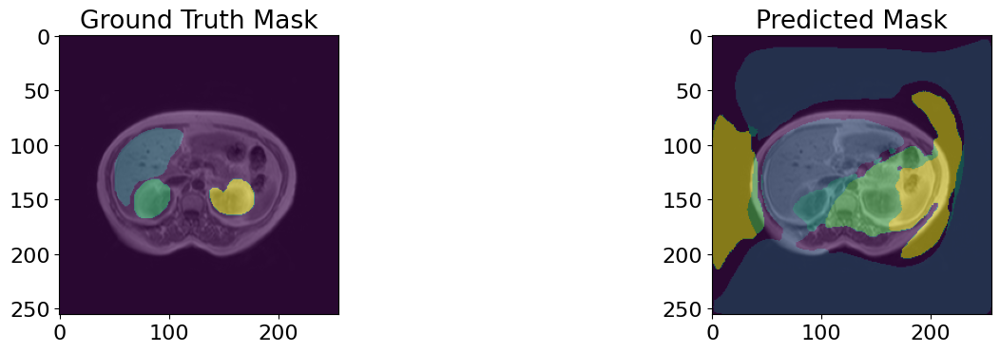

32/32 - 18s - loss: 0.0061 - accuracy: 0.9977 - mean_iou: 0.9468 - val_loss: 0.3152 - val_accuracy: 0.9573 - val_mean_iou: 0.2200 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 62/1000


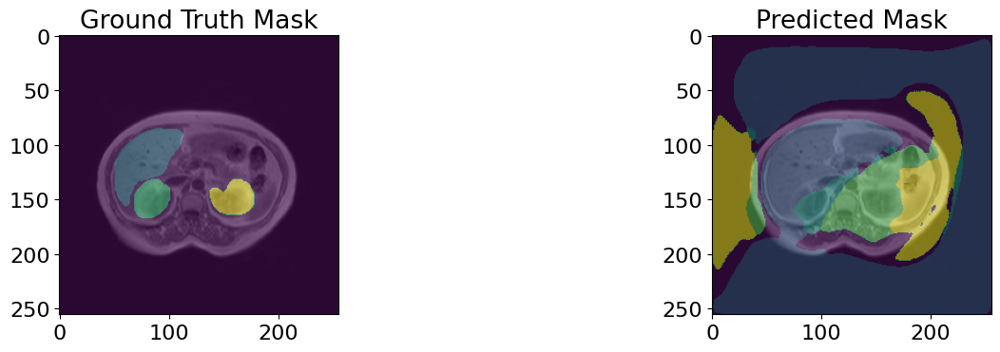

32/32 - 18s - loss: 0.0061 - accuracy: 0.9976 - mean_iou: 0.9492 - val_loss: 0.3172 - val_accuracy: 0.9573 - val_mean_iou: 0.2206 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 63/1000


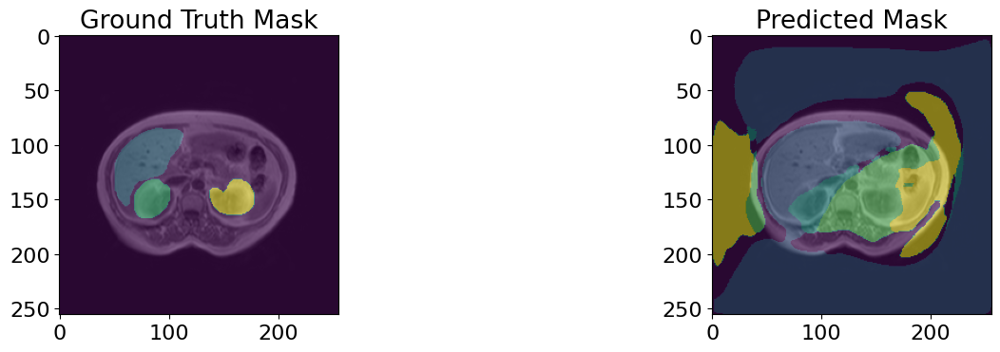

32/32 - 18s - loss: 0.0061 - accuracy: 0.9977 - mean_iou: 0.9489 - val_loss: 0.3121 - val_accuracy: 0.9571 - val_mean_iou: 0.2106 - lr: 1.0000e-04 - 18s/epoch - 575ms/step
Epoch 64/1000


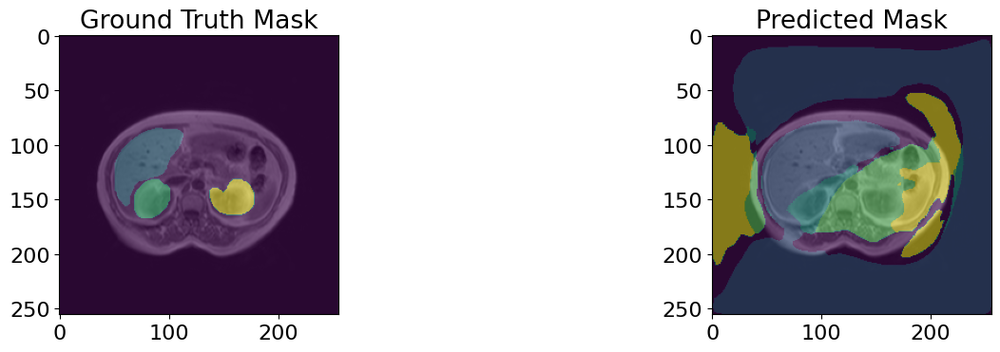

32/32 - 18s - loss: 0.0058 - accuracy: 0.9978 - mean_iou: 0.9499 - val_loss: 0.3153 - val_accuracy: 0.9571 - val_mean_iou: 0.2115 - lr: 1.0000e-04 - 18s/epoch - 575ms/step
Epoch 65/1000


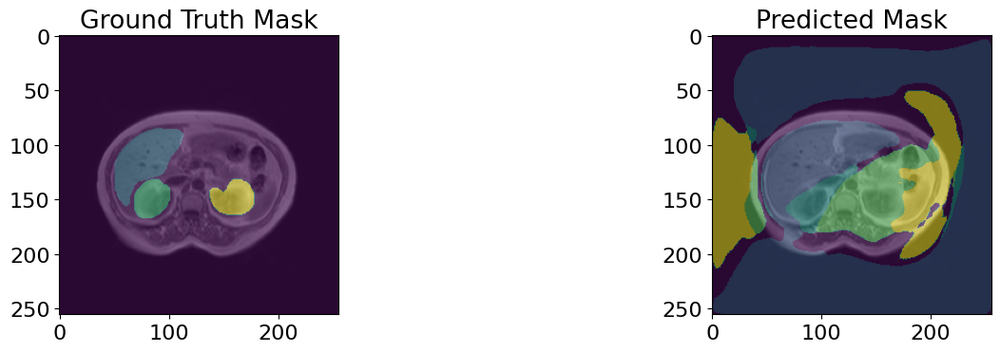

32/32 - 18s - loss: 0.0058 - accuracy: 0.9978 - mean_iou: 0.9502 - val_loss: 0.3230 - val_accuracy: 0.9573 - val_mean_iou: 0.2199 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 66/1000


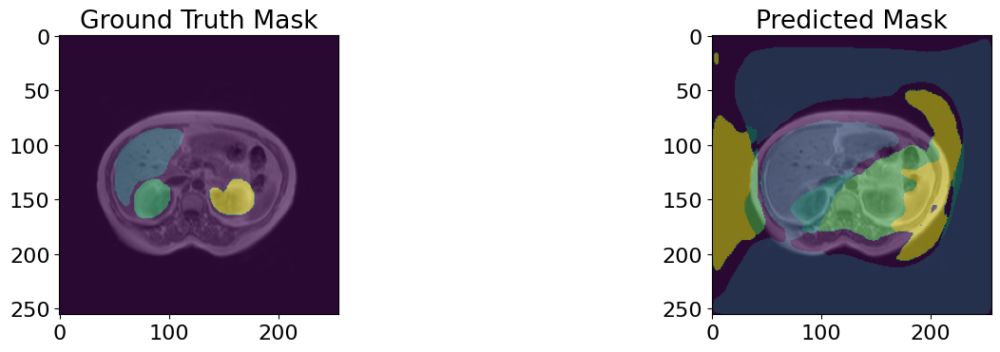

32/32 - 18s - loss: 0.0058 - accuracy: 0.9978 - mean_iou: 0.9520 - val_loss: 0.3265 - val_accuracy: 0.9573 - val_mean_iou: 0.2227 - lr: 1.0000e-04 - 18s/epoch - 578ms/step
Epoch 67/1000


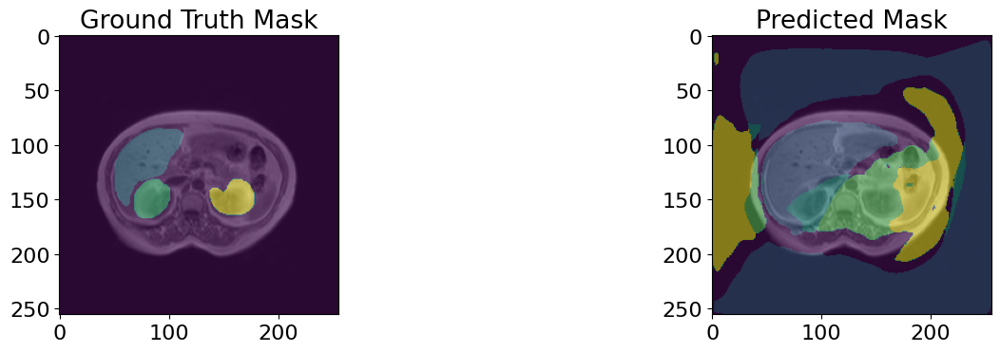

32/32 - 18s - loss: 0.0056 - accuracy: 0.9978 - mean_iou: 0.9506 - val_loss: 0.3252 - val_accuracy: 0.9574 - val_mean_iou: 0.2238 - lr: 1.0000e-04 - 18s/epoch - 575ms/step
Epoch 68/1000


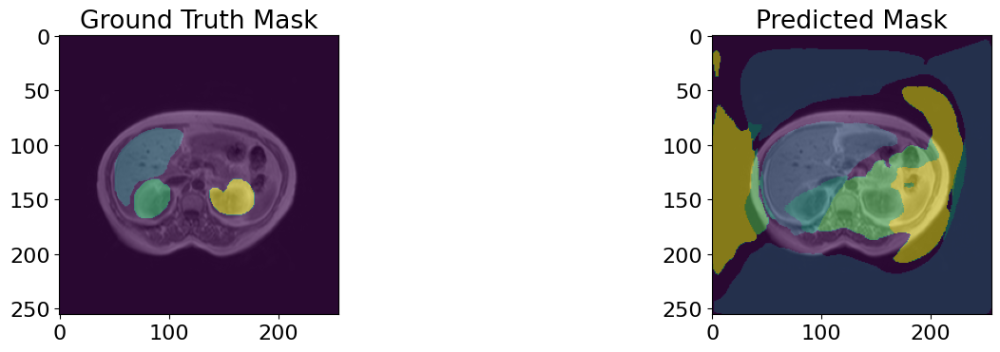

32/32 - 18s - loss: 0.0057 - accuracy: 0.9978 - mean_iou: 0.9508 - val_loss: 0.3255 - val_accuracy: 0.9574 - val_mean_iou: 0.2271 - lr: 1.0000e-04 - 18s/epoch - 575ms/step
Epoch 69/1000


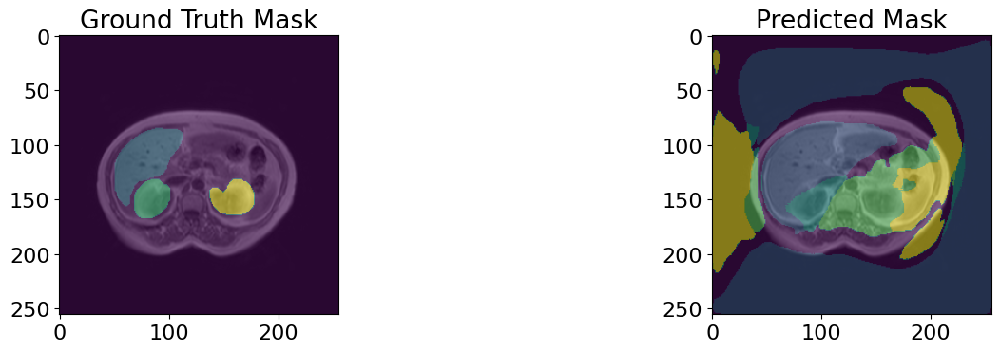

32/32 - 18s - loss: 0.0058 - accuracy: 0.9978 - mean_iou: 0.9499 - val_loss: 0.3325 - val_accuracy: 0.9575 - val_mean_iou: 0.2319 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 70/1000


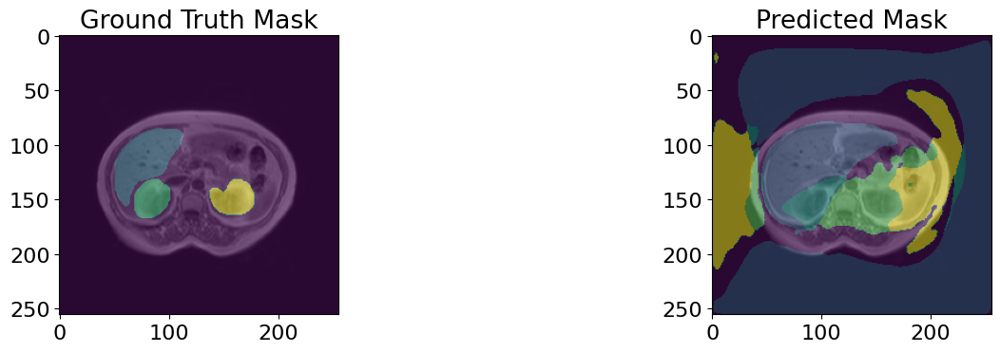

32/32 - 18s - loss: 0.0057 - accuracy: 0.9978 - mean_iou: 0.9516 - val_loss: 0.3289 - val_accuracy: 0.9576 - val_mean_iou: 0.2367 - lr: 1.0000e-04 - 18s/epoch - 575ms/step
Epoch 71/1000


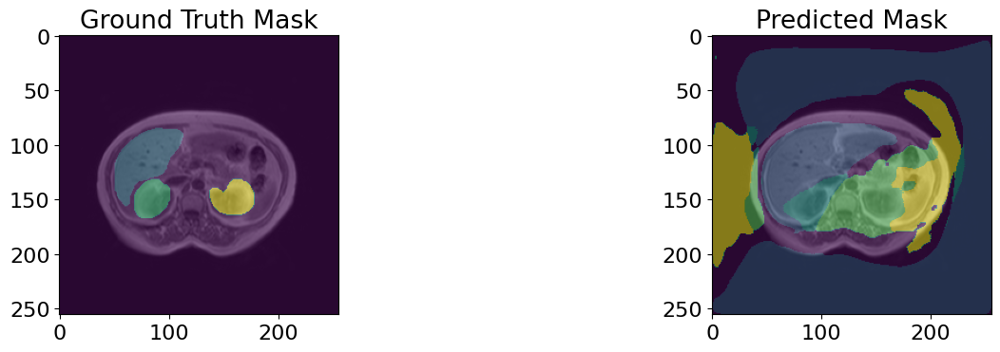

32/32 - 18s - loss: 0.0055 - accuracy: 0.9979 - mean_iou: 0.9541 - val_loss: 0.3286 - val_accuracy: 0.9575 - val_mean_iou: 0.2299 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 72/1000


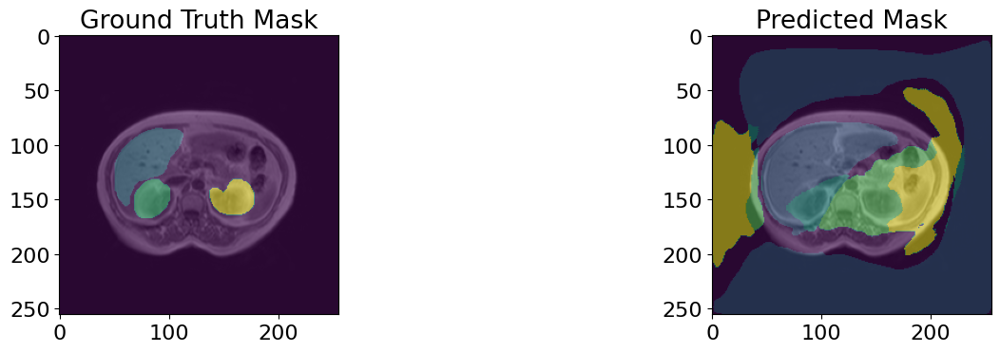

32/32 - 18s - loss: 0.0056 - accuracy: 0.9979 - mean_iou: 0.9519 - val_loss: 0.3260 - val_accuracy: 0.9574 - val_mean_iou: 0.2250 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 73/1000


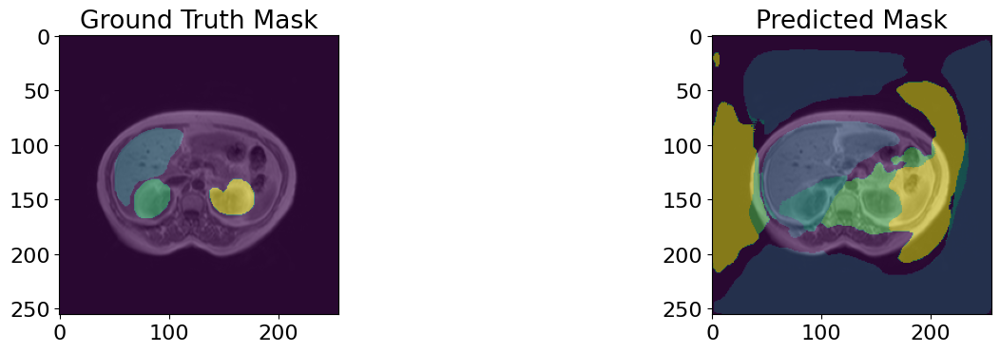

32/32 - 18s - loss: 0.0056 - accuracy: 0.9979 - mean_iou: 0.9507 - val_loss: 0.3286 - val_accuracy: 0.9575 - val_mean_iou: 0.2326 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 74/1000


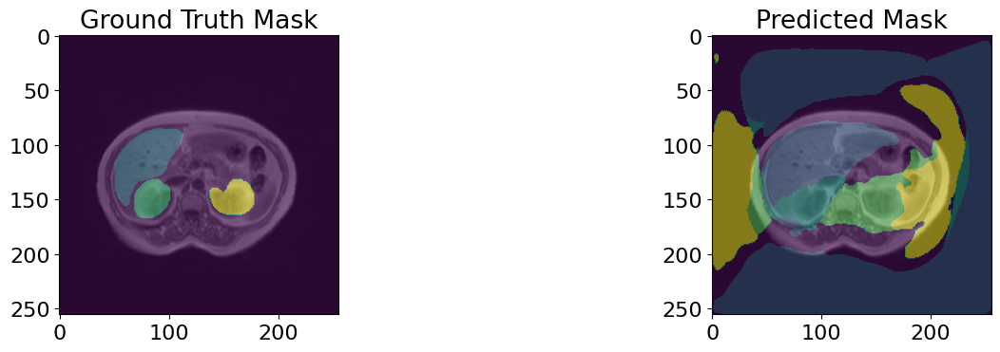

32/32 - 18s - loss: 0.0057 - accuracy: 0.9978 - mean_iou: 0.9505 - val_loss: 0.3315 - val_accuracy: 0.9575 - val_mean_iou: 0.2295 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 75/1000


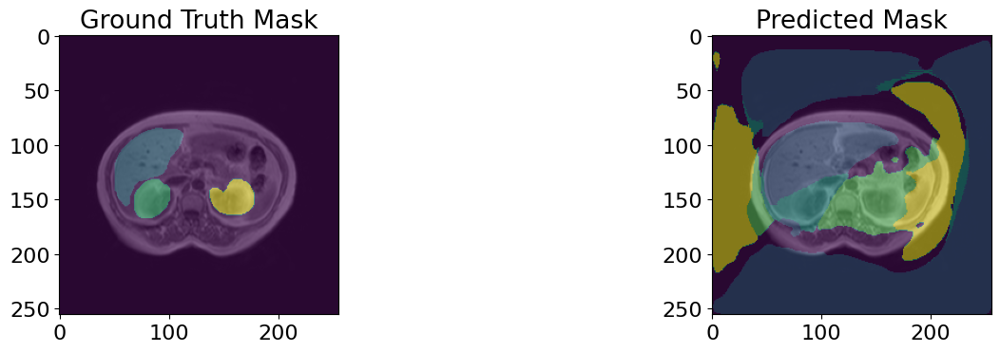

32/32 - 18s - loss: 0.0059 - accuracy: 0.9977 - mean_iou: 0.9479 - val_loss: 0.3297 - val_accuracy: 0.9576 - val_mean_iou: 0.2337 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 76/1000


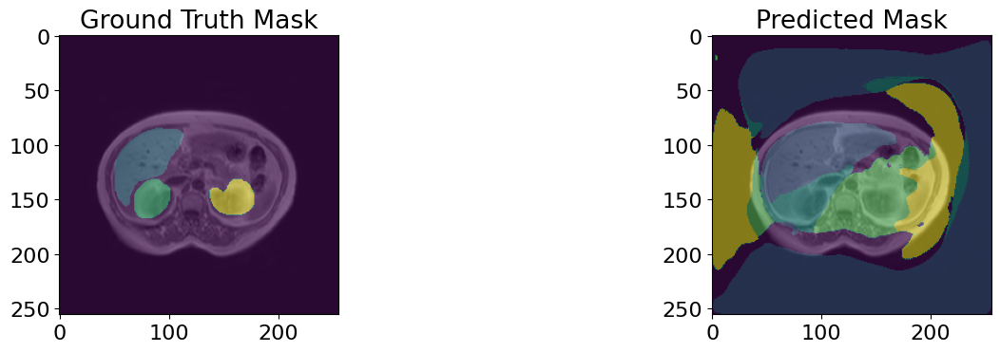

32/32 - 18s - loss: 0.0054 - accuracy: 0.9980 - mean_iou: 0.9550 - val_loss: 0.3311 - val_accuracy: 0.9577 - val_mean_iou: 0.2379 - lr: 1.0000e-04 - 18s/epoch - 576ms/step
Epoch 77/1000


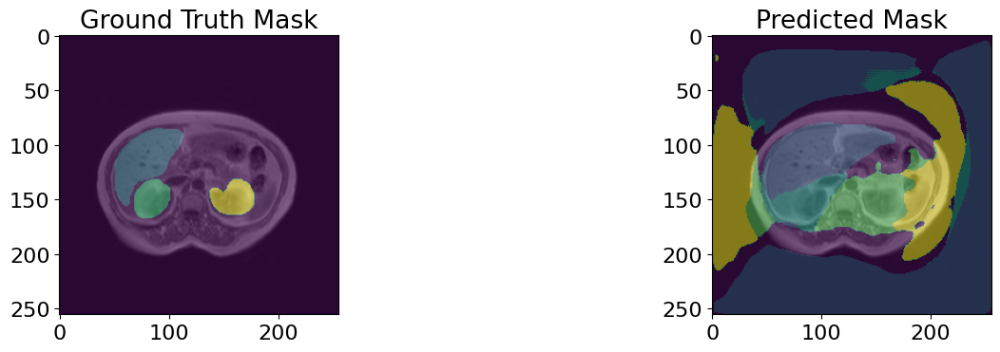

32/32 - 18s - loss: 0.0056 - accuracy: 0.9979 - mean_iou: 0.9547 - val_loss: 0.3334 - val_accuracy: 0.9574 - val_mean_iou: 0.2247 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 78/1000


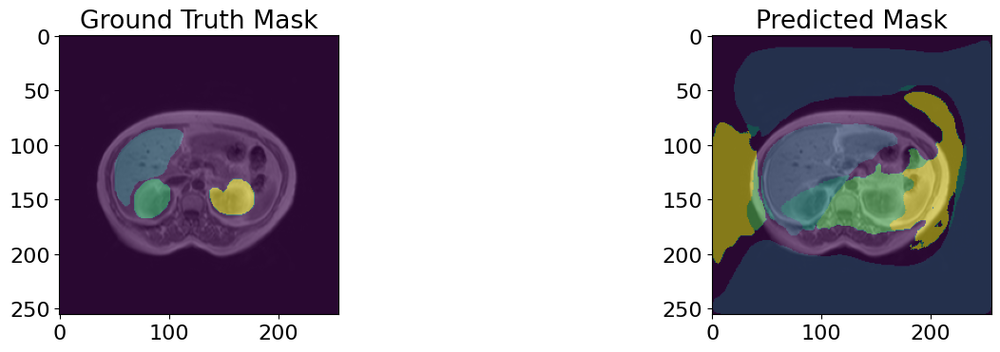

32/32 - 18s - loss: 0.0054 - accuracy: 0.9980 - mean_iou: 0.9550 - val_loss: 0.3342 - val_accuracy: 0.9576 - val_mean_iou: 0.2355 - lr: 1.0000e-04 - 18s/epoch - 572ms/step
Epoch 79/1000


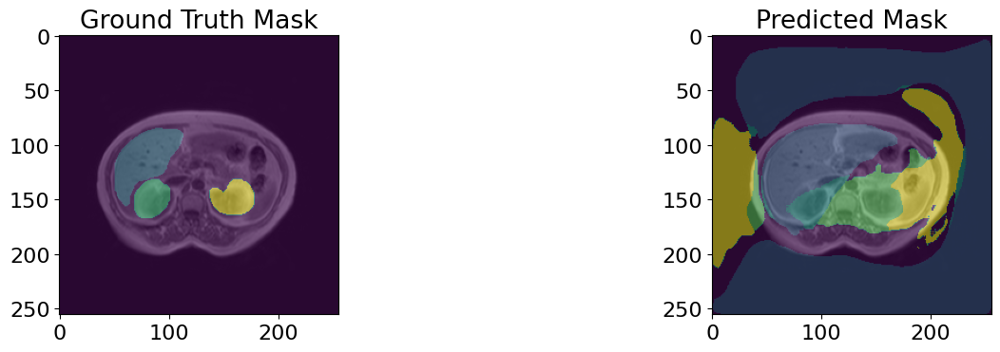

32/32 - 18s - loss: 0.0053 - accuracy: 0.9980 - mean_iou: 0.9539 - val_loss: 0.3338 - val_accuracy: 0.9576 - val_mean_iou: 0.2325 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 80/1000


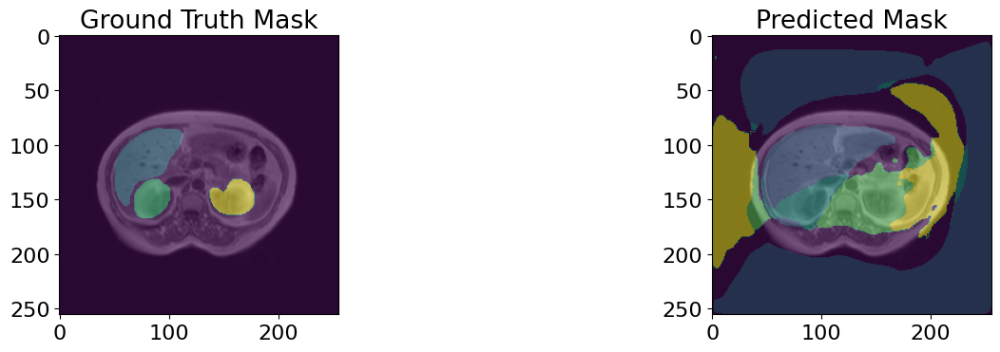

32/32 - 18s - loss: 0.0052 - accuracy: 0.9980 - mean_iou: 0.9548 - val_loss: 0.3318 - val_accuracy: 0.9576 - val_mean_iou: 0.2356 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 81/1000


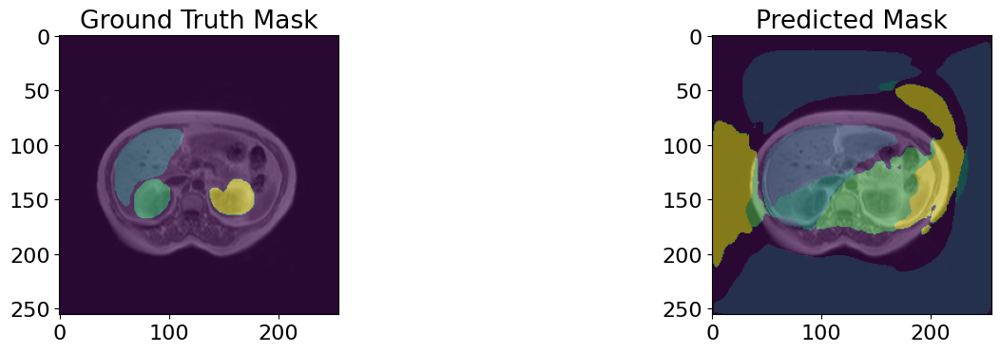

32/32 - 18s - loss: 0.0052 - accuracy: 0.9980 - mean_iou: 0.9566 - val_loss: 0.3327 - val_accuracy: 0.9574 - val_mean_iou: 0.2263 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 82/1000


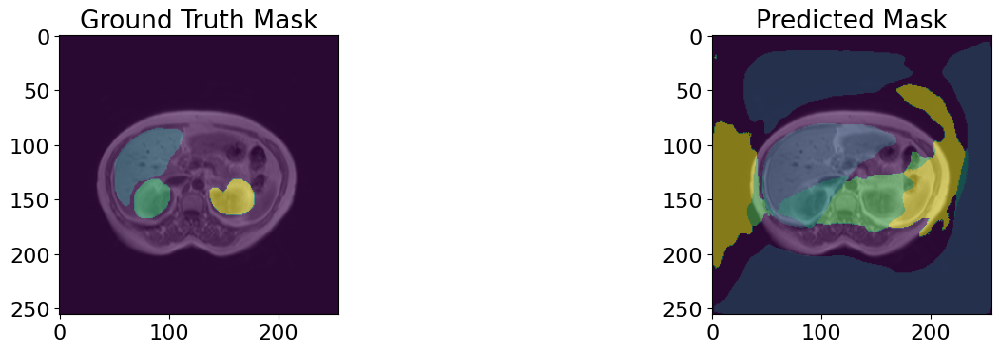

32/32 - 18s - loss: 0.0054 - accuracy: 0.9979 - mean_iou: 0.9550 - val_loss: 0.3311 - val_accuracy: 0.9574 - val_mean_iou: 0.2280 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 83/1000


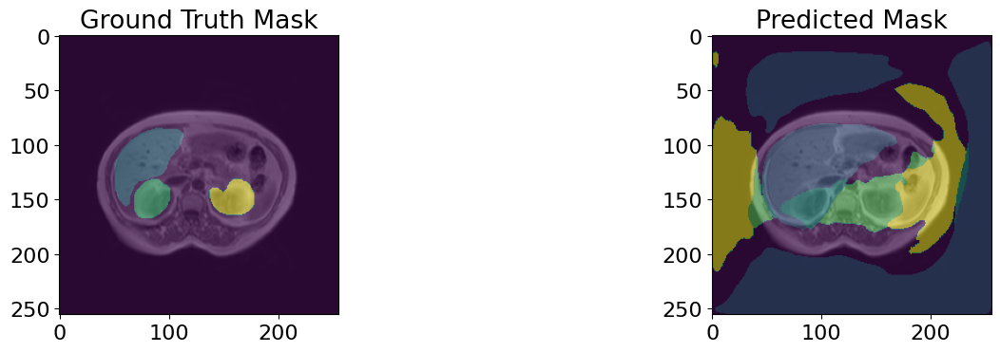

32/32 - 18s - loss: 0.0053 - accuracy: 0.9980 - mean_iou: 0.9524 - val_loss: 0.3321 - val_accuracy: 0.9574 - val_mean_iou: 0.2253 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 84/1000


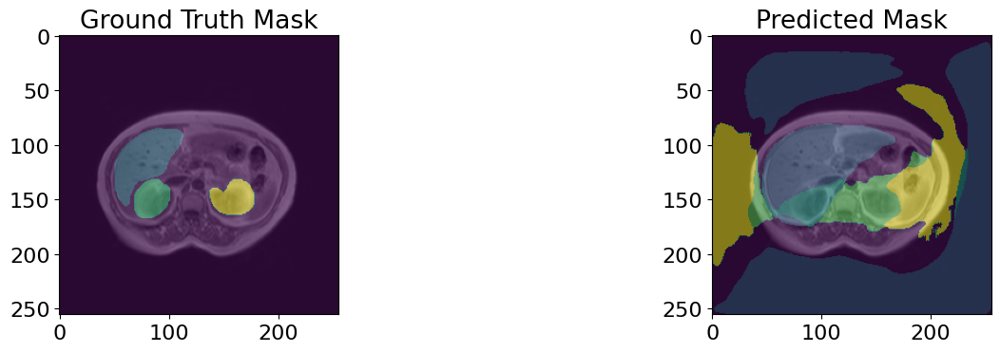

32/32 - 18s - loss: 0.0051 - accuracy: 0.9980 - mean_iou: 0.9565 - val_loss: 0.3318 - val_accuracy: 0.9573 - val_mean_iou: 0.2215 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 85/1000


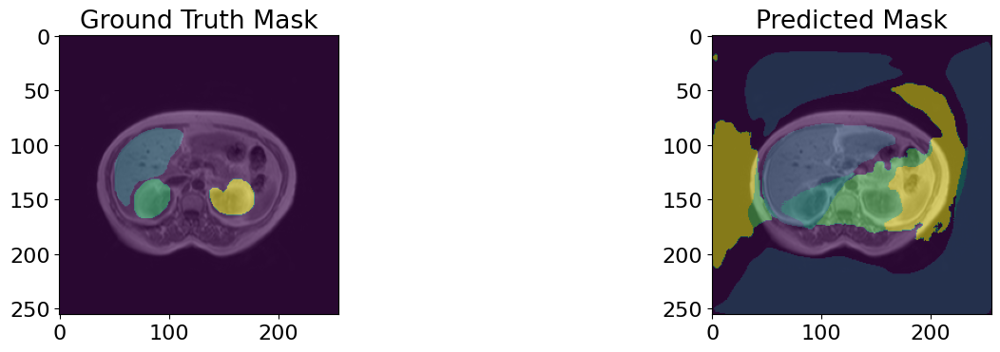

32/32 - 18s - loss: 0.0053 - accuracy: 0.9980 - mean_iou: 0.9536 - val_loss: 0.3320 - val_accuracy: 0.9574 - val_mean_iou: 0.2255 - lr: 1.0000e-04 - 18s/epoch - 574ms/step
Epoch 86/1000


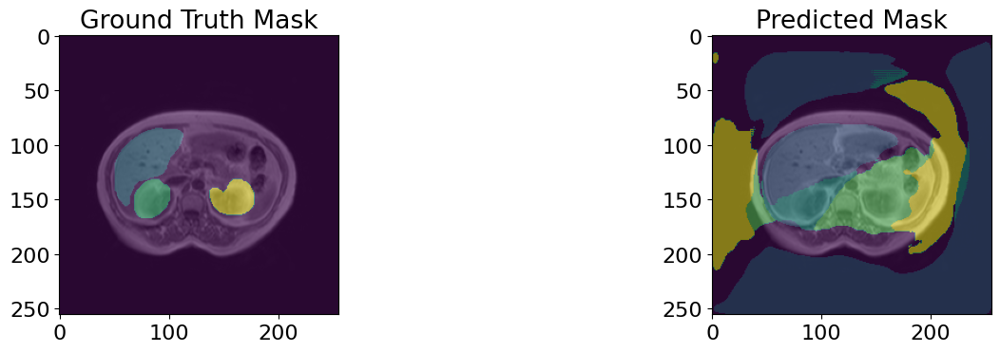

32/32 - 18s - loss: 0.0052 - accuracy: 0.9980 - mean_iou: 0.9563 - val_loss: 0.3318 - val_accuracy: 0.9573 - val_mean_iou: 0.2216 - lr: 1.0000e-04 - 18s/epoch - 572ms/step
Epoch 87/1000


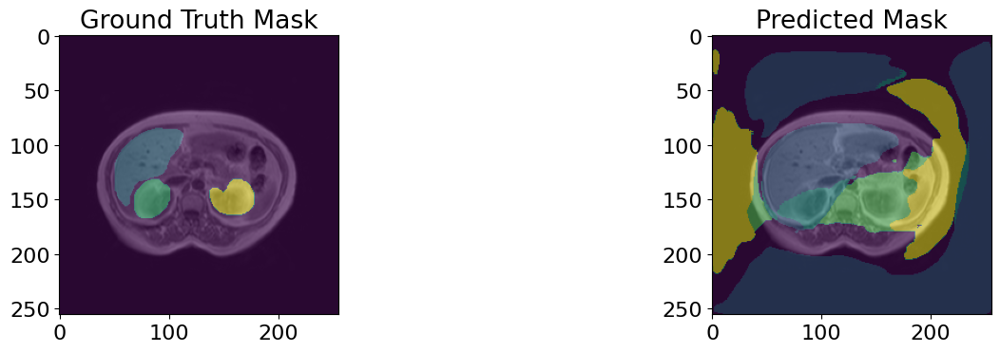

32/32 - 18s - loss: 0.0051 - accuracy: 0.9981 - mean_iou: 0.9568 - val_loss: 0.3324 - val_accuracy: 0.9576 - val_mean_iou: 0.2371 - lr: 1.0000e-04 - 18s/epoch - 571ms/step
Epoch 88/1000


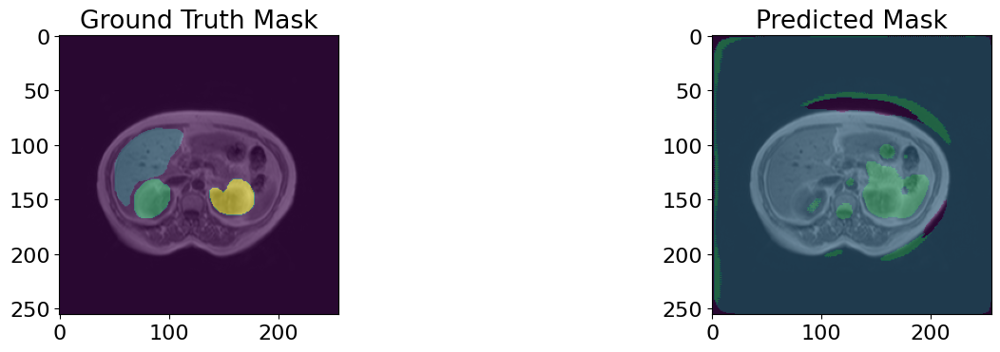

32/32 - 19s - loss: 0.0050 - accuracy: 0.9981 - mean_iou: 0.9579 - val_loss: 0.3358 - val_accuracy: 0.9576 - val_mean_iou: 0.2331 - lr: 1.0000e-04 - 19s/epoch - 590ms/step


In [33]:
history = model.fit(
    x=X_train,
    y=y_train,
    epochs = epochs,
    batch_size = batch_size,
    validation_data = (X_val, y_val),
    callbacks=[early_stopping, viz_callback, scheduler],
    verbose=2
    )

In [ ]:
best_epoch = np.argmax(history.history['val_mean_iou'])
plt.figure(figsize=(18,3))
plt.plot(history.history['loss'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Cross Entropy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(18,3))
plt.plot(history.history['accuracy'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_accuracy'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(18,3))
plt.plot(history.history['mean_iou'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_mean_iou'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Mean Intersection over Union')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
model.save('UNet_augmented')

In [ ]:
# Evaluate the model on the test set and print the results
test_loss, test_accuracy, test_mean_iou = model.evaluate(X_test, y_test, verbose=0, batch_size=10)
print(f'Test Accuracy: {round(test_accuracy, 4)}')
print(f'Test Mean Intersection over Union: {round(test_mean_iou, 4)}')

In [ ]:
# Define a function to plot triptychs for model predictions
def plot_triptychs(data, labels, index=None):
    # If index is not specified, randomly select one
    if index is None:
        index = np.random.randint(0, len(data))

    # Generate predictions for the selected index
    pred = model.predict(np.expand_dims(data[index], axis=0), verbose=0)
    pred = np.array(tf.math.argmax(pred, axis=-1))
    pred = np.reshape(pred, (256, 256, 1))

    # Plot the original image, original mask, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(20, 4))
    axes[0].set_title("Original Image")
    axes[0].imshow(data[index], cmap='gray')
    axes[1].set_title("Original Mask")
    axes[1].imshow(data[index], cmap='gray')
    #colored_image = display_color_mapped_image_continuous(labels[index])
    axes[1].imshow(np.squeeze(labels[index]),alpha=0.5)
    axes[2].set_title("Predicted Mask")
    axes[2].imshow(data[index], cmap='gray')
    #colored_image = display_color_mapped_image_continuous(pred)
    axes[2].imshow(np.squeeze(pred), alpha=0.5)
    plt.show()

# Plot triptychs for three random samples from the test set
plot_triptychs(X_test, y_test)
plot_triptychs(X_test, y_test)
plot_triptychs(X_test, y_test)